In [ ]:
#!pip install folium

In [ ]:
#!pip install geopy

In [ ]:
## faz a leitura do CSV contendo os endereços
#import pandas as pd
#df = pd.read_csv("enderecos.csv", delimiter=",")

## chama a API GeoPy
from geopy.geocoders import Nominatim
geolocator = Nominatim(user_agent="HeatMapAuto")

## consulta cada endereço e converte em uma lista de coordenadas
geocodes = []
for i in range (0,len(df.index)):    
    #texto = df['rua'][i] + "," + df['cidade'][i] + "," + df['estado'][i] + "," + df['pais'][i]
    
    location = geolocator.geocode(df['ceps'])
    geocodes.append([location.latitude,location.longitude])

## transforma a lista em um dataframe
import numpy as np

a = np.matrix(geocodes)
dfa = pd.DataFrame(a)

### Cria o mapa de calor 

import os
import folium

print(folium.__version__)

from folium.plugins import HeatMap

m = folium.Map([48., 5.], tiles='stamentoner', zoom_start=6)

HeatMap(dfa).add_to(m)

m.save(os.path.join('results', 'Heatmap.html'))

In [ ]:
### Cria o mapa de calor 

import os
import folium

print(folium.__version__)

from folium.plugins import HeatMap
from geopy.geocoders import Nominatim

In [104]:
#from geopy.geocoders import Nominatim
geolocator = Nominatim(user_agent="HeatMapAuto")
geocodes = lista_estacoes[['VL_LATITUDE','VL_LONGITUDE']]

a = np.matrix(geocodes)
dfa = pd.DataFrame(a)

m = folium.Map([-21, -50.], tiles='stamentoner', zoom_start=6)

HeatMap(dfa).add_to(m)

#m.save(os.path.join('results', 'Heatmap.html'))

In [227]:
import pandas as pd
import requests
import json
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt 
import warnings
warnings.filterwarnings('ignore')

https://mapas.inmet.gov.br/

### No mapa.

Podemos separar algumas estações em localicades que poderiam ser mais diferente entre si pra verificar a diferença das variáveis.

Por exemplo: 

Pegando um ponto no litoral, como Bertioga.
Outro em Campos Jordão 
Presidente Prudente 
Jales
Ituverava
Bauru
Regitro

https://www.youtube.com/watch?v=zWcCy4WkfnA

https://globalsolaratlas.info/download/brazil

### Site utilizado com o API do dataset

https://portal.inmet.gov.br/manual/manual-de-uso-da-api-esta%C3%A7%C3%B5es

In [228]:
# Pegando os dados utilizando o API do inmet a partir do site acima

#Para pegar dados das estações automáticas
url=requests.get('https://apitempo.inmet.gov.br/estacoes/T')
x=url.json()
df=pd.read_json(json.dumps(x))
df.head(3)

,CD_OSCAR,DC_NOME,FL_CAPITAL,DT_FIM_OPERACAO,CD_SITUACAO,TP_ESTACAO,VL_LATITUDE,CD_WSI,CD_DISTRITO,VL_ALTITUDE,SG_ESTADO,SG_ENTIDADE,CD_ESTACAO,VL_LONGITUDE,DT_INICIO_OPERACAO
0,0-2000-0-86765,ABROLHOS,N,NaN,Pane,Automatica,-17.963056,0-76-0-2906907000000408,4,20.93,BA,INMET,A422,-38.703333,2008-07-20T21:00:00.000-03:00
1,0-2000-0-81755,ACARAU,N,NaN,Pane,Automatica,-3.121111,0-76-0-2300200000000446,3,67.15,CE,INMET,A360,-40.087222,2009-04-21T21:00:00.000-03:00
2,0-2000-0-86827,AFONSO CLAUDIO,None,NaN,Pane,Automatica,-20.104167,0-76-0-3200102000000478,6,507.48,ES,INMET,A657,-41.106944,2011-09-23T21:00:00.000-03:00


In [229]:
# Iremos escolher apenas algumas das estações.
#Vide figura acima, Substituindo a de Registro pela de Itapeva, pois a de Registro havia muito dados faltosos

LISTA_ESTACOES = ['JALES', 'SAO PAULO - MIRANTE', 'PRESIDENTE PRUDENTE', 'ITAPEVA', 'BAURU', 'ITUVERAVA','VALPARAISO']

In [230]:
#Selecionando as Estações
lista_estacoes = df.query('DC_NOME == "JALES"|DC_NOME == "SAO PAULO - MIRANTE"|DC_NOME == "PRESIDENTE PRUDENTE"|DC_NOME =="ITAPEVA"|DC_NOME == "BAURU"|DC_NOME =="ITUVERAVA"|DC_NOME =="VALPARAISO"')                       
lista_estacoes = lista_estacoes.reset_index()
# Selecionando apenas algumas colunas
lista_estacoes = lista_estacoes[['DC_NOME','CD_ESTACAO','VL_LATITUDE','VL_ALTITUDE','VL_LONGITUDE','DT_INICIO_OPERACAO','CD_SITUACAO']]
lista_estacoes

,DC_NOME,CD_ESTACAO,VL_LATITUDE,VL_ALTITUDE,VL_LONGITUDE,DT_INICIO_OPERACAO,CD_SITUACAO
0,BAURU,A705,-22.358052,636.17,-49.028877,2001-08-29T21:00:00.000-03:00,Operante
1,ITAPEVA,A714,-23.981944,743.33,-48.885833,2006-07-24T21:00:00.000-03:00,Operante
2,ITUVERAVA,A753,-20.359722,610.58,-47.775278,2008-07-16T21:00:00.000-03:00,Pane
3,JALES,A733,-20.165000,460.44,-50.595000,2007-08-21T21:00:00.000-03:00,Operante
4,PRESIDENTE PRUDENTE,A707,-22.119867,431.92,-51.408637,2003-02-03T22:00:00.000-02:00,Operante
5,SAO PAULO - MIRANTE,A701,-23.496294,785.64,-46.620088,2006-07-24T21:00:00.000-03:00,Operante
6,VALPARAISO,A734,-21.319167,381.90,-50.930278,2007-08-29T21:00:00.000-03:00,Operante


# Pegando os dados das Estações Escolhidas

Agora que já temos a seleção, vamos pegar os dados das estações. 
Também utilizando o API da INMET pelo mesmo site anterior.
https://portal.inmet.gov.br/manual/manual-de-uso-da-api-esta%C3%A7%C3%B5es

## API pra dados Diários
Recuperar dados diários referentes a estação automática ou manual:


https://apitempo.inmet.gov.br/estacao/diaria/<data_inicial>/<data_final>/<cod_estacao>


https://apitempo.inmet.gov.br/estacao/diaria/2019-10-01/2019-10-31/A301


Sendo data no formato AAAA-MM-DD (ex: 2019-10-31

## API pra dados por Ano
Recuperar dados horários referentes a estação automática ou manual:

https://apitempo.inmet.gov.br/estacao/<data_inicial>/<data_final>/<cod_estacao>

https://apitempo.inmet.gov.br/estacao/2019-10-23/2019-10-23/A301

Sendo data no formato AAAA-MM-DD (ex: 2019-10-23)

In [5]:
# Lista com os nomes das Estações
nome_estacao = lista_estacoes.DC_NOME.unique()
nome_estacao

array(['BAURU', 'ITAPEVA', 'ITUVERAVA', 'JALES', 'PRESIDENTE PRUDENTE',
       'SAO PAULO - MIRANTE', 'VALPARAISO'], dtype=object)

In [6]:
cod_estacao = lista_estacoes.CD_ESTACAO.unique()
cod_estacao

array(['A705', 'A714', 'A753', 'A733', 'A707', 'A701', 'A734'],
      dtype=object)

In [7]:
# Pegando dados da primeira estação  A705 - BAURU
# Formato que vai ficar 

#url = requests.get('https://apitempo.inmet.gov.br/estacao/diaria/{data_inicio}/{data_fim}/{cod_estacao}')
#x = url.json()
#df_{cod_estacao} = pd.read_json(json.dumps(x))

In [231]:
data_inicial = '2011-01-01'
data_final = '2022-01-01'
cod_estacao = cod_estacao

Pegando os dados de 01/01/2000 até 01/01/2022 por estação:


In [9]:
# Pegando dados da primeira estação  A705 - BAURU
url = requests.get(f'https://apitempo.inmet.gov.br/estacao/{data_inicial}/{data_final}/{cod_estacao[0]}')
x = url.json()
df_A705 = pd.read_json(json.dumps(x))


# Para o A714 ou Itapeva
url = requests.get(f'https://apitempo.inmet.gov.br/estacao/{data_inicial}/{data_final}/{cod_estacao[1]}')
x = url.json()
df_A714 = pd.read_json(json.dumps(x))


# Para o A733 ou ITUVERAVA
url = requests.get(f'https://apitempo.inmet.gov.br/estacao/{data_inicial}/{data_final}/{cod_estacao[2]}')
x = url.json()
df_A733 = pd.read_json(json.dumps(x))


# Para o A753 ou JALES
url = requests.get(f'https://apitempo.inmet.gov.br/estacao/{data_inicial}/{data_final}/{cod_estacao[3]}')
x = url.json()
df_A753 = pd.read_json(json.dumps(x))


# Para o A707 ou PRESIDENTE PRUDENTE
url = requests.get(f'https://apitempo.inmet.gov.br/estacao/{data_inicial}/{data_final}/{cod_estacao[4]}')
x = url.json()
df_A707 = pd.read_json(json.dumps(x))



# Para o A771 ou SÃO PAULO - INTERLAGOS
url = requests.get(f'https://apitempo.inmet.gov.br/estacao/{data_inicial}/{data_final}/{cod_estacao[5]}')
x = url.json()
df_A701 = pd.read_json(json.dumps(x))

# Para o A734 ou Valparaíso
url = requests.get(f'https://apitempo.inmet.gov.br/estacao/{data_inicial}/{data_final}/{cod_estacao[6]}')
x = url.json()
df_A734 = pd.read_json(json.dumps(x))

In [10]:
lista_estacoes[['DC_NOME','CD_ESTACAO']]

,DC_NOME,CD_ESTACAO
0,BAURU,A705
1,ITAPEVA,A714
2,ITUVERAVA,A753
3,JALES,A733
4,PRESIDENTE PRUDENTE,A707
5,SAO PAULO - MIRANTE,A701
6,VALPARAISO,A734


### Colunas escolhidas:

'DT_MEDICAO': Data medição,

'CHUVA': Precipitação Total, diário(aut) mm,

'DC_NOME': Nome DC, 

'RAD_GLO': RADIAÇÃO GLOBAL	W/m², 

'TEM_MAX':	TEMPERATURA MÁXIMA NA HORA ANT. (AUT)	°C,

'TEM_MIN':TEMPERATURA MÍNIMA NA HORA ANT. (AUT)	°C,

'UMD_INS': 	UMIDADE RELATIVA DO AR, HORARIA	%

'HR_MEDICAO': 0 = 21h


In [11]:
# Agora separado já pelo ano 2020, escolhemos apenas as colunas acima
# DF_{código estação}_ANUAL 

DF_A705_ANUAL = df_A705[['DT_MEDICAO','CHUVA','DC_NOME','RAD_GLO', 'TEM_MAX','TEM_MIN','UMD_INS','HR_MEDICAO']]
DF_A714_ANUAL = df_A714[['DT_MEDICAO','CHUVA','DC_NOME','RAD_GLO', 'TEM_MAX','TEM_MIN','UMD_INS','HR_MEDICAO']]
DF_A753_ANUAL = df_A753[['DT_MEDICAO','CHUVA','DC_NOME','RAD_GLO', 'TEM_MAX','TEM_MIN','UMD_INS','HR_MEDICAO']]
DF_A733_ANUAL = df_A733[['DT_MEDICAO','CHUVA','DC_NOME','RAD_GLO', 'TEM_MAX','TEM_MIN','UMD_INS','HR_MEDICAO']]
DF_A707_ANUAL = df_A707[['DT_MEDICAO','CHUVA','DC_NOME','RAD_GLO', 'TEM_MAX','TEM_MIN','UMD_INS','HR_MEDICAO']]
DF_A701_ANUAL = df_A701[['DT_MEDICAO','CHUVA','DC_NOME','RAD_GLO', 'TEM_MAX','TEM_MIN','UMD_INS','HR_MEDICAO']]
DF_A734_ANUAL = df_A734[['DT_MEDICAO','CHUVA','DC_NOME','RAD_GLO', 'TEM_MAX','TEM_MIN','UMD_INS','HR_MEDICAO']]

In [12]:
#trasformando a data em datetime
DF_A705_ANUAL.loc[:,'DT_MEDICAO'] =  pd.to_datetime(DF_A705_ANUAL.loc[:,'DT_MEDICAO'], format='%Y-%m-%d')
DF_A714_ANUAL.loc[:,'DT_MEDICAO'] =  pd.to_datetime(DF_A714_ANUAL.loc[:,'DT_MEDICAO'], format='%Y-%m-%d')
DF_A753_ANUAL.loc[:,'DT_MEDICAO'] =  pd.to_datetime(DF_A753_ANUAL.loc[:,'DT_MEDICAO'], format='%Y-%m-%d')
DF_A733_ANUAL.loc[:,'DT_MEDICAO'] =  pd.to_datetime(DF_A733_ANUAL.loc[:,'DT_MEDICAO'], format='%Y-%m-%d')
DF_A707_ANUAL.loc[:,'DT_MEDICAO'] =  pd.to_datetime(DF_A707_ANUAL.loc[:,'DT_MEDICAO'], format='%Y-%m-%d')
DF_A701_ANUAL.loc[:,'DT_MEDICAO'] =  pd.to_datetime(DF_A701_ANUAL.loc[:,'DT_MEDICAO'], format='%Y-%m-%d')
DF_A734_ANUAL.loc[:,'DT_MEDICAO'] =  pd.to_datetime(DF_A734_ANUAL.loc[:,'DT_MEDICAO'], format='%Y-%m-%d')

In [13]:
#criando a coluna mês
DF_A705_ANUAL.loc[:,'MES'] = DF_A705_ANUAL.loc[:,'DT_MEDICAO'].dt.month
DF_A714_ANUAL.loc[:,'MES'] = DF_A714_ANUAL.loc[:,'DT_MEDICAO'].dt.month
DF_A753_ANUAL.loc[:,'MES'] = DF_A753_ANUAL.loc[:,'DT_MEDICAO'].dt.month
DF_A733_ANUAL.loc[:,'MES'] = DF_A733_ANUAL.loc[:,'DT_MEDICAO'].dt.month
DF_A707_ANUAL.loc[:,'MES'] = DF_A707_ANUAL.loc[:,'DT_MEDICAO'].dt.month
DF_A701_ANUAL.loc[:,'MES'] = DF_A701_ANUAL.loc[:,'DT_MEDICAO'].dt.month
DF_A734_ANUAL.loc[:,'MES'] = DF_A734_ANUAL.loc[:,'DT_MEDICAO'].dt.month

#criando a coluna ano
DF_A705_ANUAL.loc[:,'ANO'] = DF_A705_ANUAL.loc[:,'DT_MEDICAO'].dt.year
DF_A714_ANUAL.loc[:,'ANO'] = DF_A714_ANUAL.loc[:,'DT_MEDICAO'].dt.year
DF_A753_ANUAL.loc[:,'ANO'] = DF_A753_ANUAL.loc[:,'DT_MEDICAO'].dt.year
DF_A733_ANUAL.loc[:,'ANO'] = DF_A733_ANUAL.loc[:,'DT_MEDICAO'].dt.year
DF_A707_ANUAL.loc[:,'ANO'] = DF_A707_ANUAL.loc[:,'DT_MEDICAO'].dt.year
DF_A701_ANUAL.loc[:,'ANO'] = DF_A701_ANUAL.loc[:,'DT_MEDICAO'].dt.year
DF_A734_ANUAL.loc[:,'ANO'] = DF_A734_ANUAL.loc[:,'DT_MEDICAO'].dt.year

In [14]:
# Transformando o DF_A714_ANUAL['HR_MEDICAO'] que está em UTC para o correspondente para o BRASIL.
# Sendo a hora 0 = 21h.
# Criando uma coluna ['HR'] para esses valores

def hora_UTC(df):
    hora_br = 0
    HORA=[]

    for hora in df['HR_MEDICAO']:
        if hora/100+21 >= 25:
            hora_br = (hora/100+21)-24
        else:
            hora_br = hora/100+21
        HORA.append(hora_br)
    df.loc[:,'HR'] = HORA    
    return df['HR']

In [15]:
# Usando a função para toddas as estações
hora_UTC(DF_A705_ANUAL)
hora_UTC(DF_A714_ANUAL)
hora_UTC(DF_A753_ANUAL)
hora_UTC(DF_A733_ANUAL)
hora_UTC(DF_A707_ANUAL)
hora_UTC(DF_A701_ANUAL)
hora_UTC(DF_A734_ANUAL)

0        21.0
1        22.0
2        23.0
3        24.0
4         1.0
         ... 
96451    16.0
96452    17.0
96453    18.0
96454    19.0
96455    20.0
Name: HR, Length: 96456, dtype: float64

In [16]:
DF_A705_ANUAL.describe().T

,count,mean,std,min,25%,50%,75%,max
CHUVA,92161.0,0.138555,1.153916,0.00,0.00,0.000,0.0000,55.600
RAD_GLO,92828.0,648.209250,985.732098,-3.54,-3.54,19.488,1096.4885,4128.951
TEM_MAX,92903.0,22.555789,5.177109,2.30,19.10,22.000,26.1000,41.600
TEM_MIN,92903.0,21.289218,4.788737,0.80,18.20,20.900,24.3000,40.400
UMD_INS,91216.0,71.437686,19.917762,12.00,57.00,75.000,89.0000,100.000
HR_MEDICAO,96456.0,1150.000000,692.222244,0.00,575.00,1150.000,1725.0000,2300.000
MES,96456.0,6.521274,3.449469,1.00,4.00,7.000,10.0000,12.000
ANO,96456.0,2016.001493,3.163395,2011.00,2013.00,2016.000,2019.0000,2022.000
HR,96456.0,12.500000,6.922222,1.00,6.75,12.500,18.2500,24.000


In [17]:
DF_A714_ANUAL.describe().T

,count,mean,std,min,25%,50%,75%,max
CHUVA,88797.0,0.150874,1.104970,0.00,0.000,0.0000,0.00000,58.6
RAD_GLO,91386.0,709.334855,1032.546751,-3.54,-3.501,31.9125,1268.83425,4425.3
TEM_MAX,91369.0,20.444687,5.085893,1.10,16.900,20.1000,23.80000,37.5
TEM_MIN,91369.0,19.225013,4.702971,0.10,16.100,19.2000,22.10000,36.3
UMD_INS,91386.0,75.762031,17.014513,11.00,65.000,81.0000,89.00000,99.0
HR_MEDICAO,96456.0,1150.000000,692.222244,0.00,575.000,1150.0000,1725.00000,2300.0
MES,96456.0,6.521274,3.449469,1.00,4.000,7.0000,10.00000,12.0
ANO,96456.0,2016.001493,3.163395,2011.00,2013.000,2016.0000,2019.00000,2022.0
HR,96456.0,12.500000,6.922222,1.00,6.750,12.5000,18.25000,24.0


In [18]:
DF_A753_ANUAL.describe().T

,count,mean,std,min,25%,50%,75%,max
CHUVA,83476.0,0.150513,1.380077,0.00,0.000,0.000,0.000,73.200
RAD_GLO,83711.0,895.938828,1135.276718,-3.54,-3.521,151.434,1816.192,4395.584
TEM_MAX,83726.0,25.221703,5.064852,5.90,21.700,24.700,29.100,42.400
TEM_MIN,83726.0,23.725598,4.726886,4.10,20.700,23.200,27.100,40.500
UMD_INS,83783.0,63.065717,21.767578,8.00,46.000,64.000,82.000,100.000
HR_MEDICAO,96456.0,1150.000000,692.222244,0.00,575.000,1150.000,1725.000,2300.000
MES,96456.0,6.521274,3.449469,1.00,4.000,7.000,10.000,12.000
ANO,96456.0,2016.001493,3.163395,2011.00,2013.000,2016.000,2019.000,2022.000
HR,96456.0,12.500000,6.922222,1.00,6.750,12.500,18.250,24.000


In [19]:
DF_A733_ANUAL.describe().T

,count,mean,std,min,25%,50%,75%,max
CHUVA,80129.0,0.155959,1.309574,0.00,0.000,0.000,0.000,66.800
RAD_GLO,88919.0,780.912875,1069.937087,-3.54,-3.536,37.835,1536.081,4389.758
TEM_MAX,88975.0,23.436807,5.875925,-0.30,19.500,22.900,28.100,41.400
TEM_MIN,88975.0,21.687060,5.679629,-1.10,18.000,21.300,25.900,39.300
UMD_INS,88979.0,67.993493,22.103411,10.00,51.000,73.000,88.000,100.000
HR_MEDICAO,96456.0,1150.000000,692.222244,0.00,575.000,1150.000,1725.000,2300.000
MES,96456.0,6.521274,3.449469,1.00,4.000,7.000,10.000,12.000
ANO,96456.0,2016.001493,3.163395,2011.00,2013.000,2016.000,2019.000,2022.000
HR,96456.0,12.500000,6.922222,1.00,6.750,12.500,18.250,24.000


In [20]:
DF_A707_ANUAL.describe().T

,count,mean,std,min,25%,50%,75%,max
CHUVA,94969.0,0.148213,1.255800,0.000,0.000,0.0000,0.000,48.000
RAD_GLO,95366.0,594.329583,944.179087,-6.556,-3.531,19.1265,860.455,5360.348
TEM_MAX,95439.0,24.483188,5.075649,3.500,21.200,24.3000,28.100,41.800
TEM_MIN,95439.0,23.306753,4.818171,2.300,20.300,23.2000,26.600,40.700
UMD_INS,92766.0,62.171701,20.009928,10.000,47.000,63.0000,78.000,100.000
HR_MEDICAO,96456.0,1150.000000,692.222244,0.000,575.000,1150.0000,1725.000,2300.000
MES,96456.0,6.521274,3.449469,1.000,4.000,7.0000,10.000,12.000
ANO,96456.0,2016.001493,3.163395,2011.000,2013.000,2016.0000,2019.000,2022.000
HR,96456.0,12.500000,6.922222,1.000,6.750,12.5000,18.250,24.000


In [21]:
DF_A701_ANUAL.describe().T

,count,mean,std,min,25%,50%,75%,max
CHUVA,96000.0,0.176660,1.409511,0.00,0.000,0.000,0.000,77.800
RAD_GLO,95181.0,696.477139,1058.900242,-3.54,-3.415,16.628,1151.179,3999.612
TEM_MAX,96000.0,21.035727,4.757478,4.50,17.700,20.700,24.000,38.400
TEM_MIN,96000.0,19.969619,4.347394,4.00,17.000,19.800,22.600,36.100
UMD_INS,96002.0,69.488865,17.731784,12.00,58.000,75.000,83.000,100.000
HR_MEDICAO,96456.0,1150.000000,692.222244,0.00,575.000,1150.000,1725.000,2300.000
MES,96456.0,6.521274,3.449469,1.00,4.000,7.000,10.000,12.000
ANO,96456.0,2016.001493,3.163395,2011.00,2013.000,2016.000,2019.000,2022.000
HR,96456.0,12.500000,6.922222,1.00,6.750,12.500,18.250,24.000


In [22]:
DF_A734_ANUAL.describe().T

,count,mean,std,min,25%,50%,75%,max
CHUVA,89571.0,0.163341,1.472738,0.0,0.00,0.000,0.0000,78.800
RAD_GLO,90786.0,788.267484,1081.299685,-3.6,-3.54,34.859,1547.9805,4438.972
TEM_MAX,90800.0,24.610767,5.737016,-0.3,20.90,24.100,28.9000,44.300
TEM_MIN,90808.0,23.052664,5.494825,-0.8,19.70,22.800,26.8000,41.000
UMD_INS,90857.0,65.957263,21.480803,10.0,49.00,70.000,85.0000,97.000
HR_MEDICAO,96456.0,1150.000000,692.222244,0.0,575.00,1150.000,1725.0000,2300.000
MES,96456.0,6.521274,3.449469,1.0,4.00,7.000,10.0000,12.000
ANO,96456.0,2016.001493,3.163395,2011.0,2013.00,2016.000,2019.0000,2022.000
HR,96456.0,12.500000,6.922222,1.0,6.75,12.500,18.2500,24.000


As radiações com `valores negativos` podem ser **igualadas a zero**, pois esses valores são pelo fato de ser noite e não será contado.

## Tratamento dos dados
 - Radiação nula iguala a zero .
 
### Verificação de nulls nos datasets

In [23]:
def p_null(df):
    """
    Mostra as colunas que tem null e que não tem e suas porcentagens.
    """
    for column in df.columns:
        null = df[column].isnull().sum()
        p = (null/(df.shape[0]))*100
        if df[column].isnull().sum()==0:
            print(f'No null in {column}')
        else:
            print(f'Null in {column}: {p.round(2)}% or {null}nulls',)
    print( )
    
    print('The columns with the most % nulls are:')
    print(((df.isnull().sum()/df.shape[0])*100).sort_values(ascending = False))

In [24]:
p_null(DF_A705_ANUAL) #Bauru

No null in DT_MEDICAO
Null in CHUVA: 4.45% or 4295nulls
No null in DC_NOME
Null in RAD_GLO: 3.76% or 3628nulls
Null in TEM_MAX: 3.68% or 3553nulls
Null in TEM_MIN: 3.68% or 3553nulls
Null in UMD_INS: 5.43% or 5240nulls
No null in HR_MEDICAO
No null in MES
No null in ANO
No null in HR

The columns with the most % nulls are:
UMD_INS       5.432529
CHUVA         4.452807
RAD_GLO       3.761300
TEM_MAX       3.683545
TEM_MIN       3.683545
DT_MEDICAO    0.000000
DC_NOME       0.000000
HR_MEDICAO    0.000000
MES           0.000000
ANO           0.000000
HR            0.000000
dtype: float64


In [25]:
p_null(DF_A714_ANUAL) #Itapeva

No null in DT_MEDICAO
Null in CHUVA: 7.94% or 7659nulls
No null in DC_NOME
Null in RAD_GLO: 5.26% or 5070nulls
Null in TEM_MAX: 5.27% or 5087nulls
Null in TEM_MIN: 5.27% or 5087nulls
Null in UMD_INS: 5.26% or 5070nulls
No null in HR_MEDICAO
No null in MES
No null in ANO
No null in HR

The columns with the most % nulls are:
CHUVA         7.940408
TEM_MAX       5.273907
TEM_MIN       5.273907
RAD_GLO       5.256283
UMD_INS       5.256283
DT_MEDICAO    0.000000
DC_NOME       0.000000
HR_MEDICAO    0.000000
MES           0.000000
ANO           0.000000
HR            0.000000
dtype: float64


In [26]:
p_null(DF_A753_ANUAL) #Ituverava

No null in DT_MEDICAO
Null in CHUVA: 13.46% or 12980nulls
No null in DC_NOME
Null in RAD_GLO: 13.21% or 12745nulls
Null in TEM_MAX: 13.2% or 12730nulls
Null in TEM_MIN: 13.2% or 12730nulls
Null in UMD_INS: 13.14% or 12673nulls
No null in HR_MEDICAO
No null in MES
No null in ANO
No null in HR

The columns with the most % nulls are:
CHUVA         13.456913
RAD_GLO       13.213279
TEM_MAX       13.197727
TEM_MIN       13.197727
UMD_INS       13.138633
DT_MEDICAO     0.000000
DC_NOME        0.000000
HR_MEDICAO     0.000000
MES            0.000000
ANO            0.000000
HR             0.000000
dtype: float64


In [27]:
p_null(DF_A733_ANUAL) #Jales

No null in DT_MEDICAO
Null in CHUVA: 16.93% or 16327nulls
No null in DC_NOME
Null in RAD_GLO: 7.81% or 7537nulls
Null in TEM_MAX: 7.76% or 7481nulls
Null in TEM_MIN: 7.76% or 7481nulls
Null in UMD_INS: 7.75% or 7477nulls
No null in HR_MEDICAO
No null in MES
No null in ANO
No null in HR

The columns with the most % nulls are:
CHUVA         16.926889
RAD_GLO        7.813926
TEM_MAX        7.755868
TEM_MIN        7.755868
UMD_INS        7.751721
DT_MEDICAO     0.000000
DC_NOME        0.000000
HR_MEDICAO     0.000000
MES            0.000000
ANO            0.000000
HR             0.000000
dtype: float64


In [28]:
p_null(DF_A707_ANUAL) #Presidente Prudente

No null in DT_MEDICAO
Null in CHUVA: 1.54% or 1487nulls
No null in DC_NOME
Null in RAD_GLO: 1.13% or 1090nulls
Null in TEM_MAX: 1.05% or 1017nulls
Null in TEM_MIN: 1.05% or 1017nulls
Null in UMD_INS: 3.83% or 3690nulls
No null in HR_MEDICAO
No null in MES
No null in ANO
No null in HR

The columns with the most % nulls are:
UMD_INS       3.825579
CHUVA         1.541636
RAD_GLO       1.130049
TEM_MAX       1.054367
TEM_MIN       1.054367
DT_MEDICAO    0.000000
DC_NOME       0.000000
HR_MEDICAO    0.000000
MES           0.000000
ANO           0.000000
HR            0.000000
dtype: float64


In [29]:
p_null(DF_A701_ANUAL) #São Paulo

No null in DT_MEDICAO
Null in CHUVA: 0.47% or 456nulls
No null in DC_NOME
Null in RAD_GLO: 1.32% or 1275nulls
Null in TEM_MAX: 0.47% or 456nulls
Null in TEM_MIN: 0.47% or 456nulls
Null in UMD_INS: 0.47% or 454nulls
No null in HR_MEDICAO
No null in MES
No null in ANO
No null in HR

The columns with the most % nulls are:
RAD_GLO       1.321846
CHUVA         0.472754
TEM_MAX       0.472754
TEM_MIN       0.472754
UMD_INS       0.470681
DT_MEDICAO    0.000000
DC_NOME       0.000000
HR_MEDICAO    0.000000
MES           0.000000
ANO           0.000000
HR            0.000000
dtype: float64


In [30]:
p_null(DF_A734_ANUAL) #Valparaíso

No null in DT_MEDICAO
Null in CHUVA: 7.14% or 6885nulls
No null in DC_NOME
Null in RAD_GLO: 5.88% or 5670nulls
Null in TEM_MAX: 5.86% or 5656nulls
Null in TEM_MIN: 5.86% or 5648nulls
Null in UMD_INS: 5.8% or 5599nulls
No null in HR_MEDICAO
No null in MES
No null in ANO
No null in HR

The columns with the most % nulls are:
CHUVA         7.137970
RAD_GLO       5.878328
TEM_MAX       5.863814
TEM_MIN       5.855520
UMD_INS       5.804719
DT_MEDICAO    0.000000
DC_NOME       0.000000
HR_MEDICAO    0.000000
MES           0.000000
ANO           0.000000
HR            0.000000
dtype: float64


A partir da estação A714 tem que fazer tratamento de null

### Verificando a coluna com mais null = Chuva.

 Nos null da coluna 'Chuva' vamos **completar com 0** pois é muito mais provavel que não tenha chovido.

In [32]:
DF_A714_ANUAL.loc[DF_A714_ANUAL['CHUVA'].isnull()]['DT_MEDICAO'].unique()


array(['2011-03-09T00:00:00.000000000', '2011-03-28T00:00:00.000000000',
       '2011-03-29T00:00:00.000000000', '2011-03-30T00:00:00.000000000',
       '2011-12-22T00:00:00.000000000', '2011-12-23T00:00:00.000000000',
       '2011-12-24T00:00:00.000000000', '2011-12-25T00:00:00.000000000',
       '2011-12-26T00:00:00.000000000', '2011-12-27T00:00:00.000000000',
       '2011-12-28T00:00:00.000000000', '2011-12-29T00:00:00.000000000',
       '2011-12-30T00:00:00.000000000', '2011-12-31T00:00:00.000000000',
       '2012-01-01T00:00:00.000000000', '2012-01-02T00:00:00.000000000',
       '2012-01-03T00:00:00.000000000', '2012-01-04T00:00:00.000000000',
       '2012-01-05T00:00:00.000000000', '2012-01-06T00:00:00.000000000',
       '2012-01-07T00:00:00.000000000', '2012-01-08T00:00:00.000000000',
       '2012-01-09T00:00:00.000000000', '2012-01-10T00:00:00.000000000',
       '2012-01-11T00:00:00.000000000', '2012-01-12T00:00:00.000000000',
       '2012-01-13T00:00:00.000000000', '2012-01-14

In [39]:
df2012 = DF_A714_ANUAL.query('ANO == 2012')
df2012_null =df2012.loc[df2012['CHUVA'].isnull()]

In [40]:
df2012_null['MES'].unique()

array([ 1,  2,  3,  4,  5,  6,  7,  8, 10, 11], dtype=int64)

In [43]:
pd.set_option('max_rows',8000)
df2012.query('MES==1')

,DT_MEDICAO,CHUVA,DC_NOME,RAD_GLO,TEM_MAX,TEM_MIN,UMD_INS,HR_MEDICAO,MES,ANO,HR
8760,2012-01-01,NaN,ITAPEVA,NaN,NaN,NaN,NaN,0,1,2012,21.0
8761,2012-01-01,NaN,ITAPEVA,NaN,NaN,NaN,NaN,100,1,2012,22.0
8762,2012-01-01,NaN,ITAPEVA,NaN,NaN,NaN,NaN,200,1,2012,23.0
8763,2012-01-01,NaN,ITAPEVA,NaN,NaN,NaN,NaN,300,1,2012,24.0
8764,2012-01-01,NaN,ITAPEVA,NaN,NaN,NaN,NaN,400,1,2012,1.0
8765,2012-01-01,NaN,ITAPEVA,NaN,NaN,NaN,NaN,500,1,2012,2.0
8766,2012-01-01,NaN,ITAPEVA,NaN,NaN,NaN,NaN,600,1,2012,3.0
8767,2012-01-01,NaN,ITAPEVA,NaN,NaN,NaN,NaN,700,1,2012,4.0
8768,2012-01-01,NaN,ITAPEVA,NaN,NaN,NaN,NaN,800,1,2012,5.0
8769,2012-01-01,NaN,ITAPEVA,NaN,NaN,NaN,NaN,900,1,2012,6.0


In [44]:
df2012.query('MES==2')

,DT_MEDICAO,CHUVA,DC_NOME,RAD_GLO,TEM_MAX,TEM_MIN,UMD_INS,HR_MEDICAO,MES,ANO,HR
9504,2012-02-01,NaN,ITAPEVA,NaN,NaN,NaN,NaN,0,2,2012,21.0
9505,2012-02-01,NaN,ITAPEVA,NaN,NaN,NaN,NaN,100,2,2012,22.0
9506,2012-02-01,NaN,ITAPEVA,NaN,NaN,NaN,NaN,200,2,2012,23.0
9507,2012-02-01,NaN,ITAPEVA,NaN,NaN,NaN,NaN,300,2,2012,24.0
9508,2012-02-01,NaN,ITAPEVA,NaN,NaN,NaN,NaN,400,2,2012,1.0
9509,2012-02-01,NaN,ITAPEVA,NaN,NaN,NaN,NaN,500,2,2012,2.0
9510,2012-02-01,NaN,ITAPEVA,NaN,NaN,NaN,NaN,600,2,2012,3.0
9511,2012-02-01,NaN,ITAPEVA,NaN,NaN,NaN,NaN,700,2,2012,4.0
9512,2012-02-01,NaN,ITAPEVA,NaN,NaN,NaN,NaN,800,2,2012,5.0
9513,2012-02-01,NaN,ITAPEVA,NaN,NaN,NaN,NaN,900,2,2012,6.0


In [45]:
df2012.query('MES==3')

,DT_MEDICAO,CHUVA,DC_NOME,RAD_GLO,TEM_MAX,TEM_MIN,UMD_INS,HR_MEDICAO,MES,ANO,HR
10200,2012-03-01,NaN,ITAPEVA,NaN,NaN,NaN,NaN,0,3,2012,21.0
10201,2012-03-01,NaN,ITAPEVA,NaN,NaN,NaN,NaN,100,3,2012,22.0
10202,2012-03-01,NaN,ITAPEVA,NaN,NaN,NaN,NaN,200,3,2012,23.0
10203,2012-03-01,NaN,ITAPEVA,NaN,NaN,NaN,NaN,300,3,2012,24.0
10204,2012-03-01,NaN,ITAPEVA,NaN,NaN,NaN,NaN,400,3,2012,1.0
10205,2012-03-01,NaN,ITAPEVA,NaN,NaN,NaN,NaN,500,3,2012,2.0
10206,2012-03-01,NaN,ITAPEVA,NaN,NaN,NaN,NaN,600,3,2012,3.0
10207,2012-03-01,NaN,ITAPEVA,NaN,NaN,NaN,NaN,700,3,2012,4.0
10208,2012-03-01,NaN,ITAPEVA,NaN,NaN,NaN,NaN,800,3,2012,5.0
10209,2012-03-01,NaN,ITAPEVA,NaN,NaN,NaN,NaN,900,3,2012,6.0


In [46]:
df2012.query('MES==4')

,DT_MEDICAO,CHUVA,DC_NOME,RAD_GLO,TEM_MAX,TEM_MIN,UMD_INS,HR_MEDICAO,MES,ANO,HR
10944,2012-04-01,NaN,ITAPEVA,-3.540,19.0,18.4,83.0,0,4,2012,21.0
10945,2012-04-01,NaN,ITAPEVA,-3.540,18.4,17.7,86.0,100,4,2012,22.0
10946,2012-04-01,NaN,ITAPEVA,-3.540,17.7,17.1,88.0,200,4,2012,23.0
10947,2012-04-01,NaN,ITAPEVA,-3.540,17.1,16.9,86.0,300,4,2012,24.0
10948,2012-04-01,NaN,ITAPEVA,-3.540,16.9,16.5,85.0,400,4,2012,1.0
10949,2012-04-01,NaN,ITAPEVA,-3.540,16.6,15.9,87.0,500,4,2012,2.0
10950,2012-04-01,NaN,ITAPEVA,-3.540,16.0,14.9,90.0,600,4,2012,3.0
10951,2012-04-01,NaN,ITAPEVA,-3.540,15.0,14.2,92.0,700,4,2012,4.0
10952,2012-04-01,NaN,ITAPEVA,-3.540,15.2,14.6,92.0,800,4,2012,5.0
10953,2012-04-01,NaN,ITAPEVA,-3.540,14.6,14.3,93.0,900,4,2012,6.0


In [47]:
#DF_A714_ANUAL.loc[DF_A714_ANUAL['CHUVA'].isnull(),'CHUVA']=0  #ou
DF_A714_ANUAL.loc[:,'CHUVA'].fillna(0.0, inplace=True)

DF_A753_ANUAL.loc[DF_A753_ANUAL['CHUVA'].isnull(),'CHUVA']=0

#DF_A733_ANUAL.loc[DF_A733_ANUAL['CHUVA'].isnull(),'CHUVA']=0
DF_A733_ANUAL.loc[:,'CHUVA'].fillna(0.0, inplace=True)

DF_A707_ANUAL.loc[DF_A707_ANUAL['CHUVA'].isnull(),'CHUVA']=0

DF_A701_ANUAL.loc[DF_A701_ANUAL['CHUVA'].isnull(),'CHUVA']=0

DF_A734_ANUAL.loc[DF_A734_ANUAL['CHUVA'].isnull(),'CHUVA']=0

## Verificando coluna RAD_GLO = radiação 




Estação A714 - Itapeva

In [34]:
DF_A714_ANUAL.loc[DF_A714_ANUAL['RAD_GLO'].isnull()]['DT_MEDICAO'].nunique() 
# 67 dias que houve falha na medição

393

In [35]:
DF_A714_ANUAL['RAD_GLO'].isnull().sum()

5070

## Tratamento da Radiação:

Entre as 21h até as 5 da manhã, independente do mês é provavel que não há nenhum pouco de radiação, se houver vai ser pequena então iguala esses valores a zero.

In [48]:
def treat_null_RAD(df):
    condiction = df.loc[:,'HR']>=21.0                   # condição se o horário é mais que 21h
    df.loc[:,'RAD']  = np.where(condiction, 0.0 ,df.loc[:,'RAD_GLO'])
    condiction2 = df.loc[:,'HR'] <= 5.0                 # condição se o horário é menos que 5h
    df['RAD']  = np.where(condiction2, 0.0 ,df['RAD'])
    df['RAD']  = df['RAD'].apply(lambda x: 0.0 if x<0 else x) # ou se negativo é igual a zero
    
    # Fazendo o tratamento do restante dos nulls com o method=ffill
    df.fillna(method='ffill',axis=0,inplace=True)

In [49]:
# Fazendo a função acima para todas as estações:
treat_null_RAD(DF_A705_ANUAL)
treat_null_RAD(DF_A714_ANUAL)
treat_null_RAD(DF_A753_ANUAL)
treat_null_RAD(DF_A733_ANUAL)
treat_null_RAD(DF_A707_ANUAL)
treat_null_RAD(DF_A701_ANUAL)
treat_null_RAD(DF_A734_ANUAL)

In [50]:
#média diária

df_dia_A705 = DF_A705_ANUAL.groupby(['DT_MEDICAO'],as_index=False).mean()
df_dia_A714 = DF_A714_ANUAL.groupby(['DT_MEDICAO'],as_index=False).mean()
df_dia_A753 = DF_A753_ANUAL.groupby(['DT_MEDICAO'],as_index=False).mean()
df_dia_A733 = DF_A733_ANUAL.groupby(['DT_MEDICAO'],as_index=False).mean()
df_dia_A707 = DF_A707_ANUAL.groupby(['DT_MEDICAO'],as_index=False).mean()
df_dia_A701 = DF_A701_ANUAL.groupby(['DT_MEDICAO'],as_index=False).mean()
df_dia_A734 = DF_A734_ANUAL.groupby(['DT_MEDICAO'],as_index=False).mean()

In [51]:
# Média Anual
df_ano_A705 = df_dia_A705.groupby(['ANO'],as_index=False).mean()
df_ano_A714 = df_dia_A714.groupby(['ANO'],as_index=False).mean()
df_ano_A753 = df_dia_A753.groupby(['ANO'],as_index=False).mean()
df_ano_A733 = df_dia_A733.groupby(['ANO'],as_index=False).mean()
df_ano_A707 = df_dia_A707.groupby(['ANO'],as_index=False).mean()
df_ano_A701 = df_dia_A701.groupby(['ANO'],as_index=False).mean()
df_ano_A734 = df_dia_A734.groupby(['ANO'],as_index=False).mean()

In [52]:
def box_plot(data,figsize):

    data = data
    figsize =figsize
    x = 'ANO'
    y = 'RAD'
    title = 'Variação de radiação diária média ao longo do Ano'
    xlabel = 'Anos'
    ylabel = 'Radiação GLobal W/m²'
    fig, ax = plt.subplots(figsize = figsize)
    sns.boxplot(x ,y,data = data, ax = ax)
    ax.set(title = title, xlabel = xlabel, ylabel = ylabel)
    plt.grid(True, 'both','both');

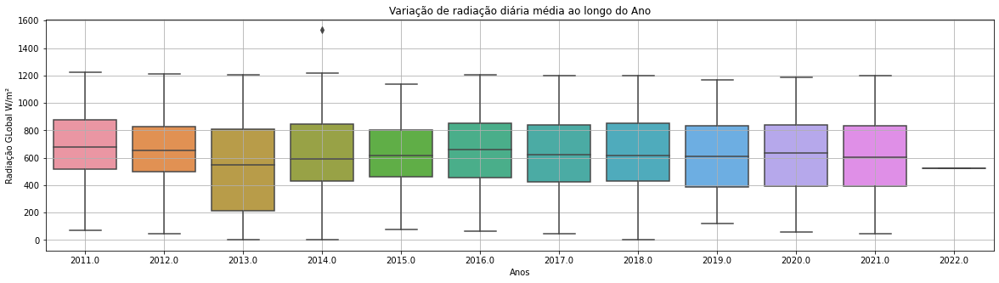

In [53]:
box_plot(df_dia_A705,(20,5))

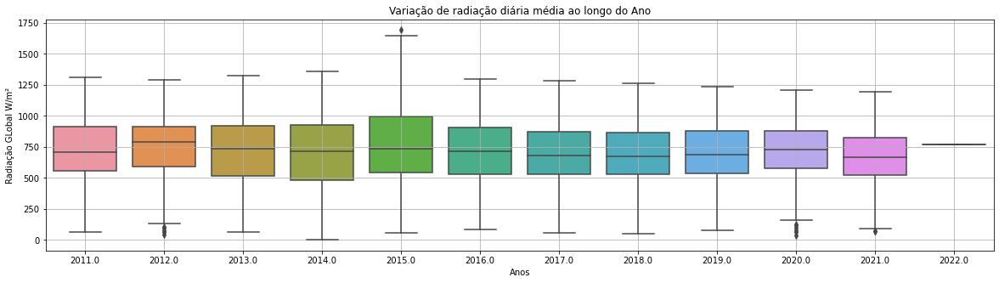

In [89]:
box_plot(df_dia_A714,(20,5))

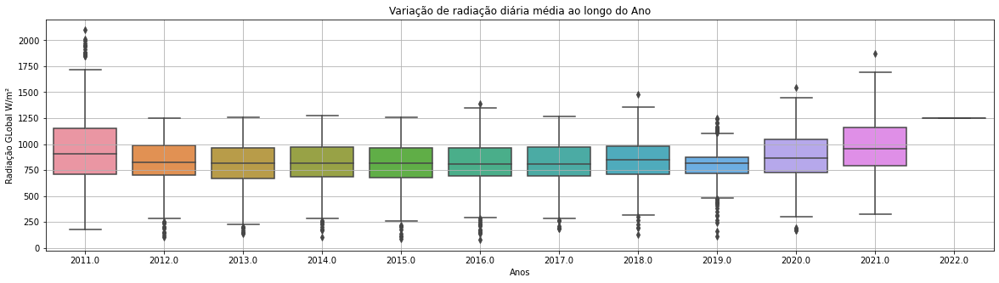

In [90]:
box_plot(df_dia_A753,(20,5))

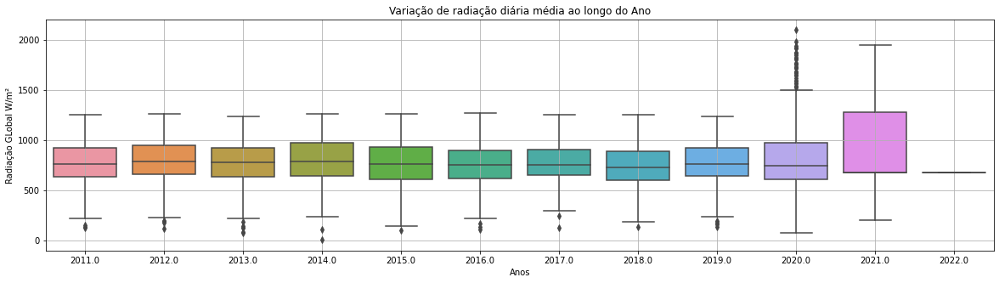

In [91]:
box_plot(df_dia_A733,(20,5))

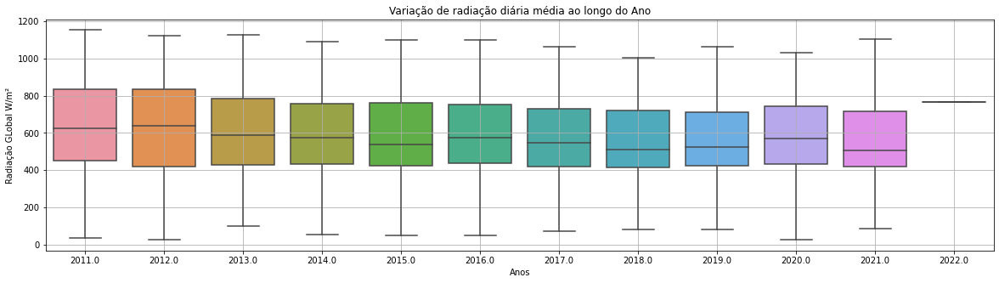

In [92]:
box_plot(df_dia_A707,(20,5))

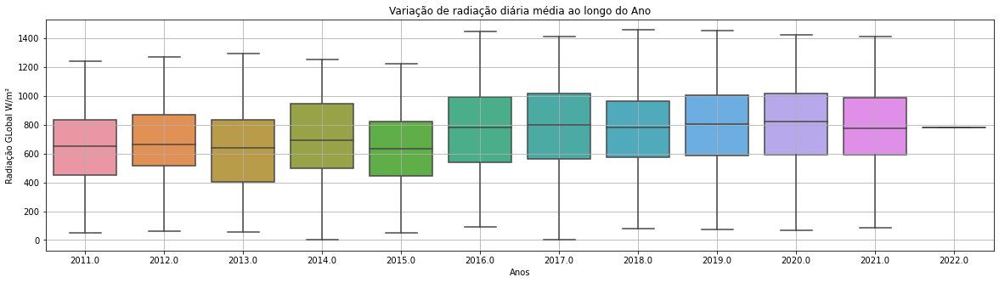

In [93]:
box_plot(df_dia_A701,(20,5))

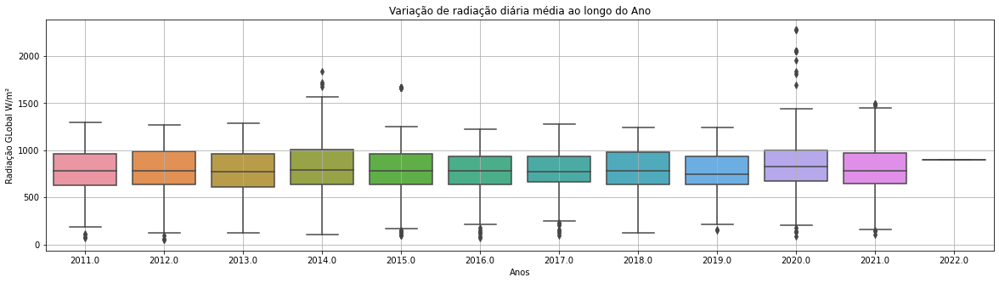

In [94]:
box_plot(df_dia_A734,(20,5))#,'ANO','RAD','Variação de radiação diária média ao longo do Ano','Anos','Radiação GLobal W/m²'

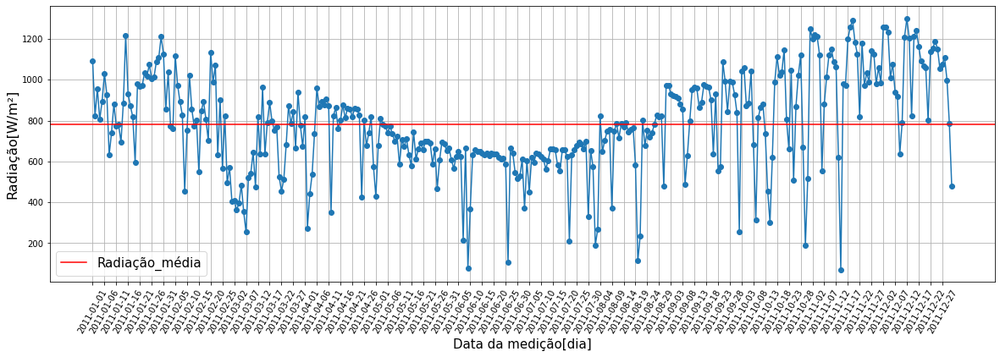

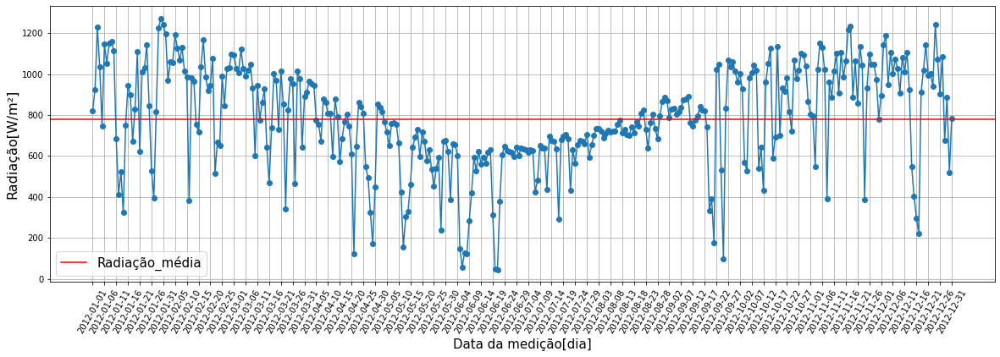

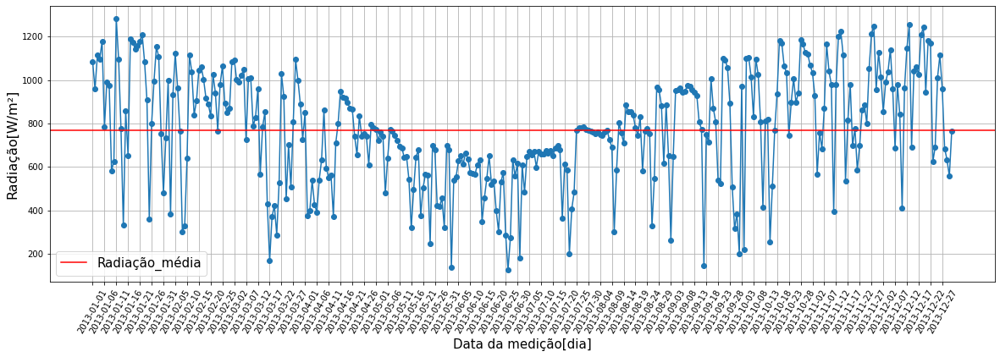

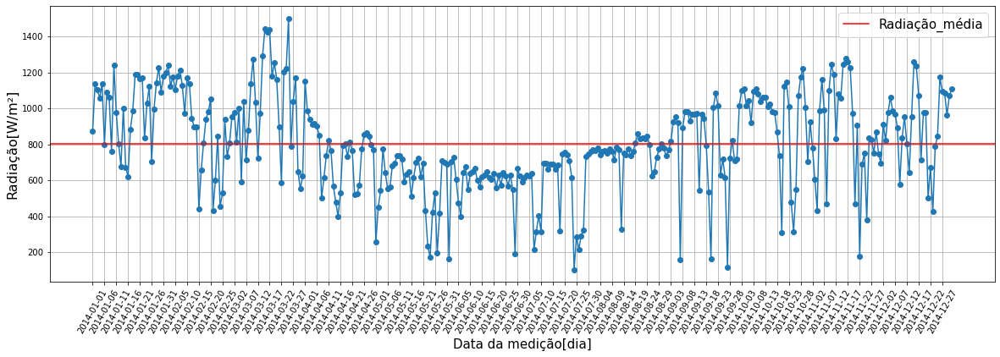

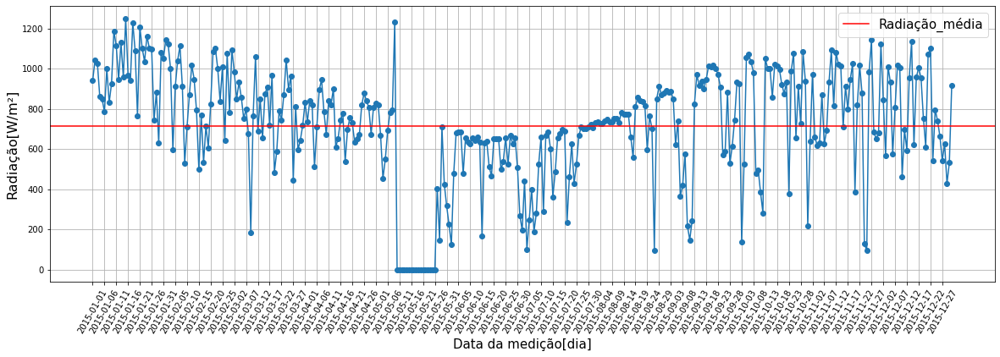

...

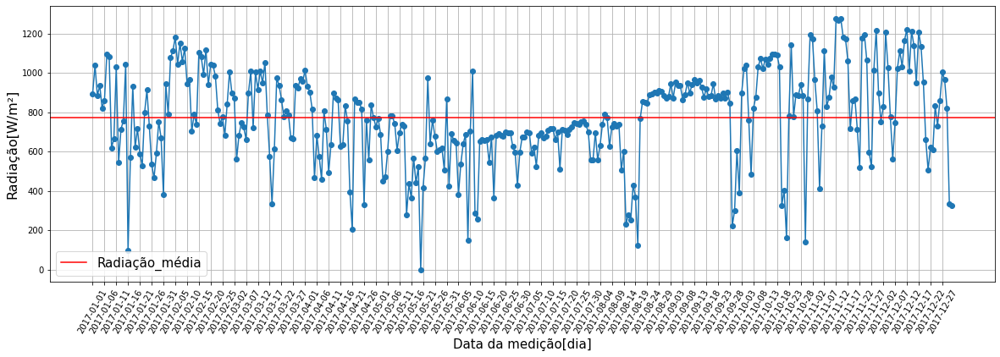

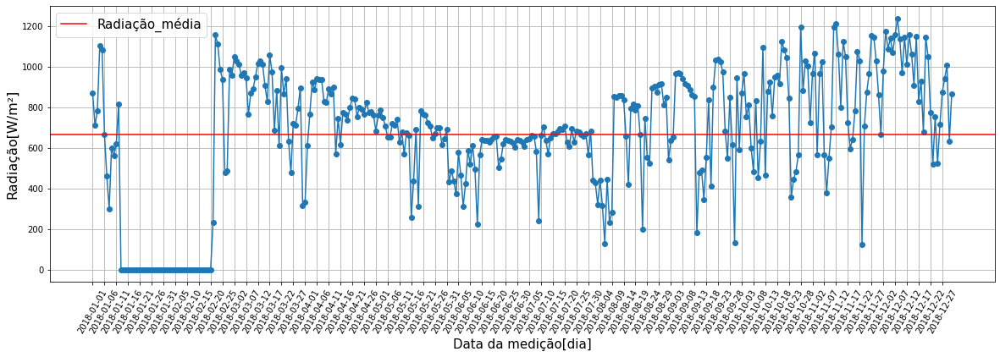

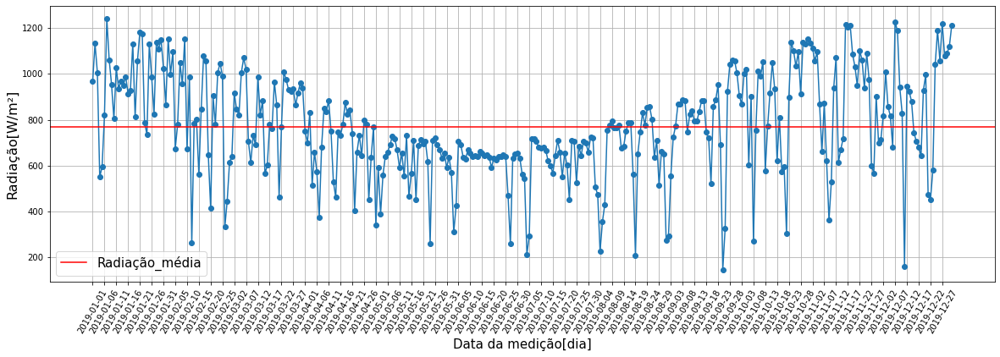

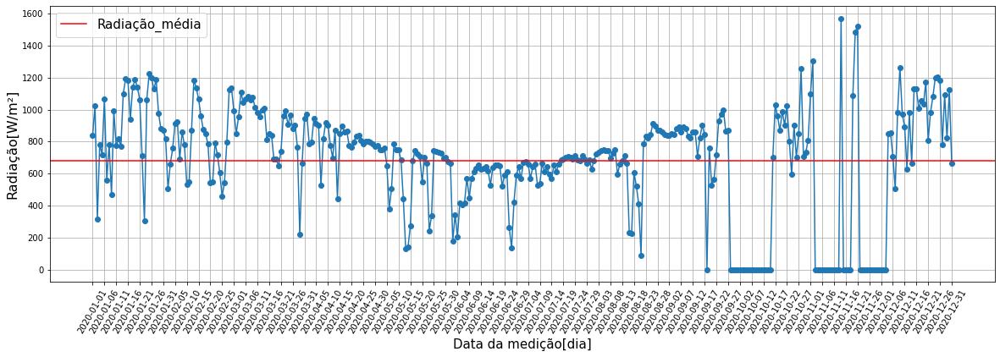

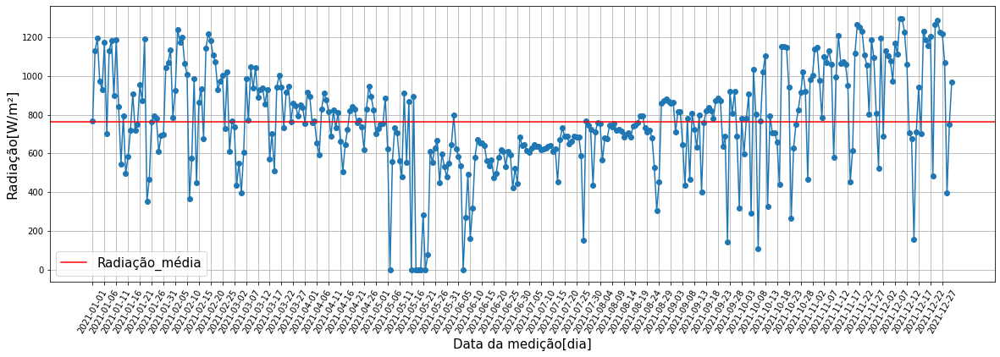

In [102]:
anos = range(ano_incial,ano_final,1)

for ano in anos:
    df = df_dia_A734.query(f'ANO == {ano}')
    plt.figure(figsize=(20,6))
    plt.plot(df['DT_MEDICAO'] , df['RAD'],'o-')
    plt.xlabel('Data da medição[dia]',fontsize= 15)
    plt.ylabel('Radiação[W/m²]',fontsize=16)
    plt.axhline(df['RAD'].mean(),c = 'red',label='Radiação_média')
    plt.grid(True, 'both','both')
    plt.xticks(df.iloc[range(0,df.shape[0],5),0],rotation=60)
    plt.legend(fontsize=15);

In [239]:
pd.to_datetime(data_inicial, format='%Y-%m-%d')

Timestamp('2011-01-01 00:00:00')

In [233]:
anos = range(ano_incial,ano_final,1)

for ano in anos:
    df = df_dia_A734.query(f'ANO == {ano}')
    plt.title(f'Temperatura[°C] média diária durante o ano {ano}')
    plt.figure(figsize=(20,6))
    plt.plot(df['DT_MEDICAO'] , df['TEM_MAX'],'o-',color = 'black')
    plt.xlabel('Data da medição[dia]',fontsize= 15)
    plt.ylabel('Temperatura[°C]',fontsize=16)
    plt.axhline(df['TEM_MAX'].mean(),c = 'red',label='TMax_média')
    plt.grid(True, 'both','both')
    plt.xticks(df.iloc[range(0,df.shape[0],5),0],rotation=60)
    plt.legend(fontsize=15);

NameError: name 'ano_incial' is not defined

# Funções para os gráficos :

Gráfico de Radiação, temperatura máxima, pluviométrico e umidade instantânea.

In [38]:
def graf_RAD_dia(df):
    import matplotlib.pyplot as plt 
    
    df_dia = df.groupby(['DT_MEDICAO'],as_index=False).mean() #transforma no df do dia
    plt.figure(figsize=(20,6))
    plt.plot(df_dia['DT_MEDICAO'] , df_dia['RAD'],'o-')
    
    plt.xlabel('Data da medição[dia]',fontsize= 15)
    plt.ylabel('Radiação[W/m²]',fontsize=16)
    
    plt.axhline(df['RAD'].mean(),c = 'red',label='Radiação_média')
    plt.grid(True, 'both','both')
    plt.xticks(df_dia.iloc[range(0,df_dia.shape[0],5),0],rotation=60)
    plt.legend(fontsize=15);

def graf_TEMP_dia(df):
    import matplotlib.pyplot as plt 
    
    df_dia = df.groupby(['DT_MEDICAO'],as_index=False).mean() #transforma no df do dia
    plt.figure(figsize=(20,6))
    plt.plot(df_dia['DT_MEDICAO'] , df_dia['TEM_MAX'],'o-', color = 'black')
    #plt.plot(df_dia['DT_MEDICAO'] , df_dia['TEM_MIN'],'o-')
    
    plt.xlabel('Data da medição[dia]',fontsize= 15)
    plt.ylabel('Temperatura[°C]',fontsize=16)
    
    plt.axhline(df['TEM_MAX'].mean(),c = 'red',label='TMax_média')
   # plt.axhline(df['TEM_MIN'].mean(),c = 'purple',label='TMin_média')
    plt.grid(True, 'both','both')
    plt.xticks(df_dia.iloc[range(0,df_dia.shape[0],5),0],rotation=60)
    plt.legend(fontsize=15);

def graf_PLUV_dia(df):
    import matplotlib.pyplot as plt 
    
    df_dia = df.groupby(['DT_MEDICAO'],as_index=False).mean() #transforma no df do dia
    plt.figure(figsize=(20,6))
    plt.bar(df_dia['DT_MEDICAO'] , df_dia['CHUVA'],1,color = 'green')
    plt.xlabel('Data da medição[dia]',fontsize= 15)
    plt.ylabel('Chuva[mm/dia]',fontsize=16)
    plt.axhline(df['CHUVA'].mean(),c = 'red',label='Chuva_média')
    plt.grid(True, 'both','both')
    plt.xticks(df_dia.iloc[range(0,df_dia.shape[0],5),0],rotation=60)
    plt.legend(fontsize=15);

def graf_UMID_dia(df):
    import matplotlib.pyplot as plt 
    
    df_dia = df.groupby(['DT_MEDICAO'],as_index=False).mean() #transforma no df do dia
    plt.figure(figsize=(20,6))
    plt.bar(df_dia['DT_MEDICAO'] , df_dia['UMD_INS'],1,color = 'purple')
    plt.xlabel('Data da medição[dia]',fontsize= 15)
    plt.ylabel('UMIDADE RELATIVA DO AR [MÉDIA_DIÁRIA %] ',fontsize=16)
    plt.axhline(df['UMD_INS'].mean(),c = 'red',label='umidade_média_anual')
    plt.grid(True, 'both','both')
    plt.xticks(df_dia.iloc[range(0,df_dia.shape[0],5),0],rotation=60)
    plt.legend(fontsize=15);

def hist_RAD(df):
    import matplotlib.pyplot as plt 
    df_dia = df.groupby(['DT_MEDICAO'],as_index=False).mean() #transforma no df do dia
    #plt.figure(figsize=(10,6))
    sns.histplot(data = df_dia,x='RAD', kde = True)
    plt.xlabel('Radiação[W/m²]',fontsize=16)
    plt.suptitle('Frequência Radiação dias/ano}',fontsize=15)
    plt.grid(True, 'both','both')
    #sns.set_style('whitegrid');

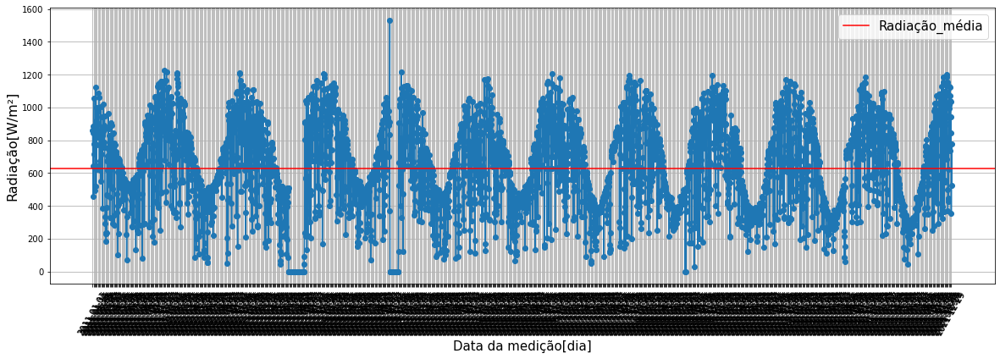

In [39]:
graf_RAD_dia(DF_A705_ANUAL)   #Bauru

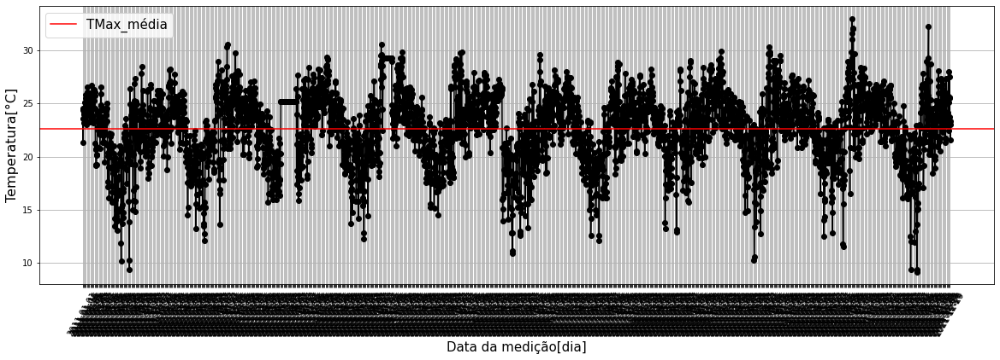

In [113]:
graf_TEMP_dia(DF_A705_ANUAL)   #Bauru

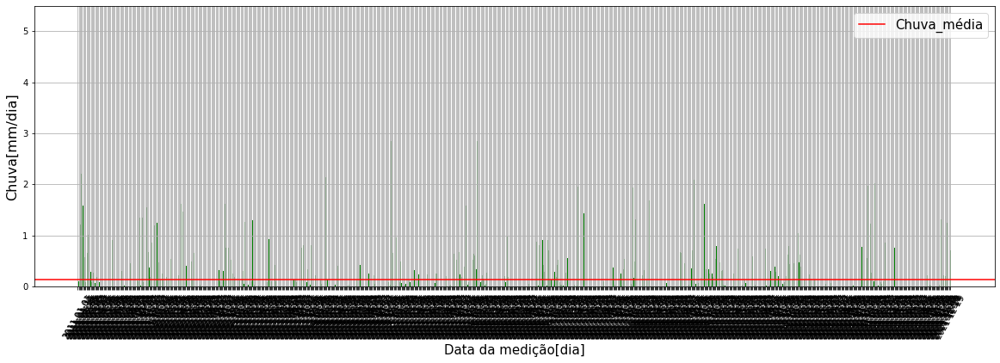

In [114]:
graf_PLUV_dia(DF_A705_ANUAL)   #Bauru

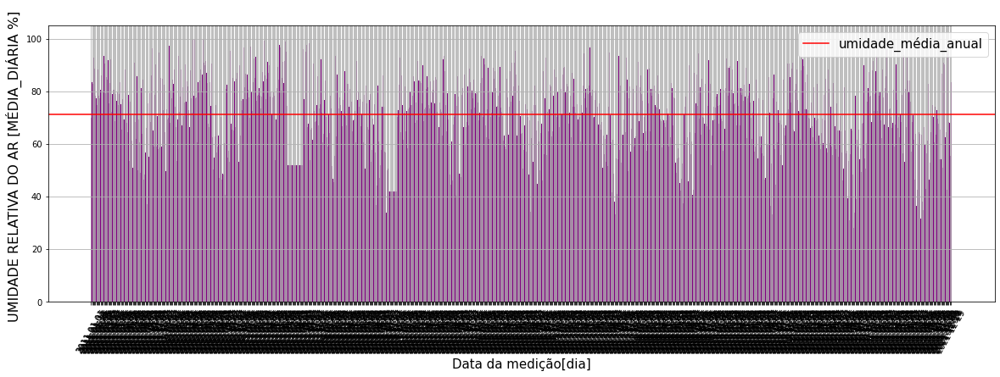

In [115]:
graf_UMID_dia(DF_A705_ANUAL)   #Bauru

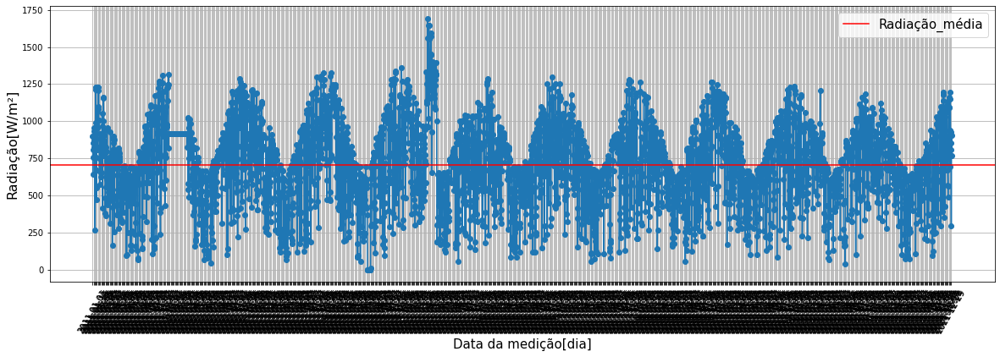

In [116]:
graf_RAD_dia(DF_A714_ANUAL)   #Itapeva

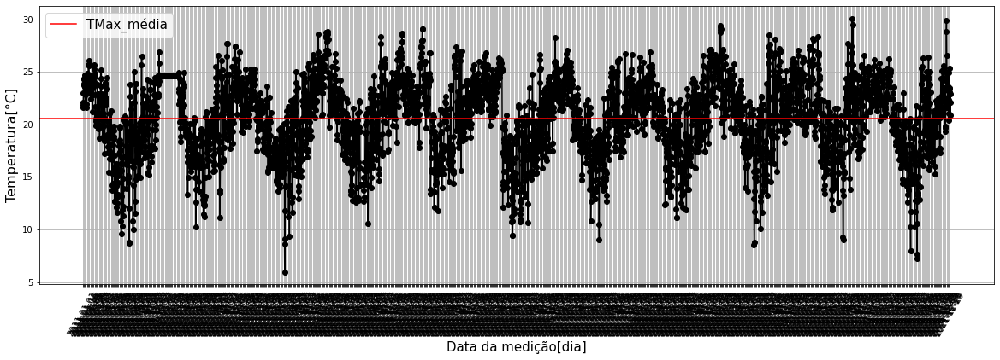

In [117]:
graf_TEMP_dia(DF_A714_ANUAL)  #Itapeva

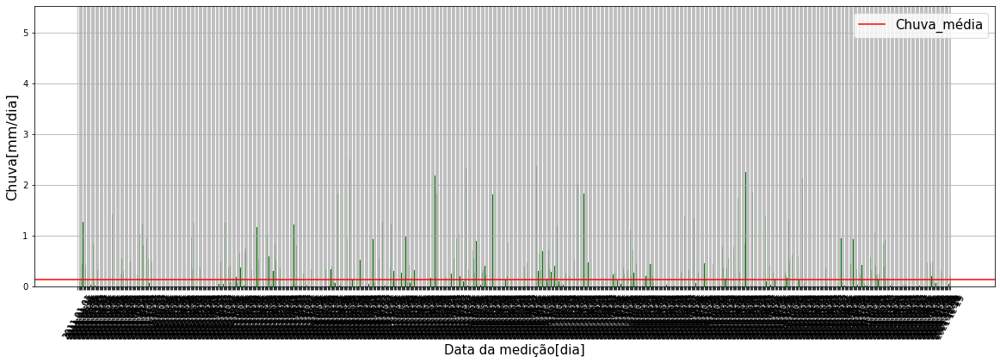

In [118]:
graf_PLUV_dia(DF_A714_ANUAL)   #Itapeva

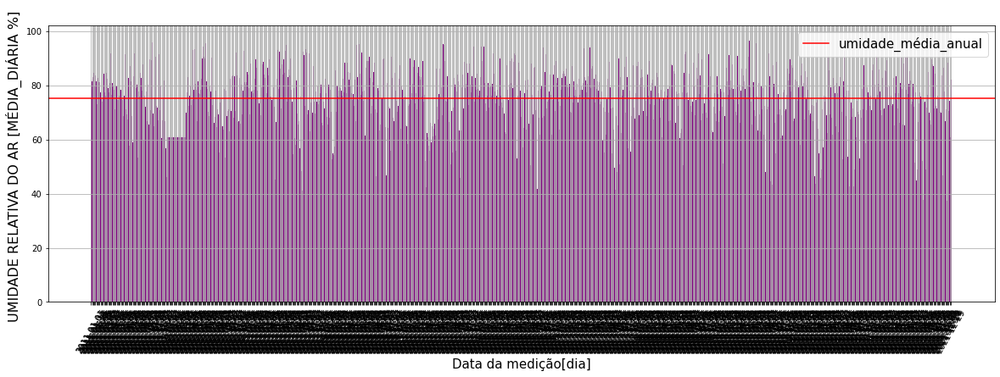

In [119]:
graf_UMID_dia(DF_A714_ANUAL)   #Itapeva

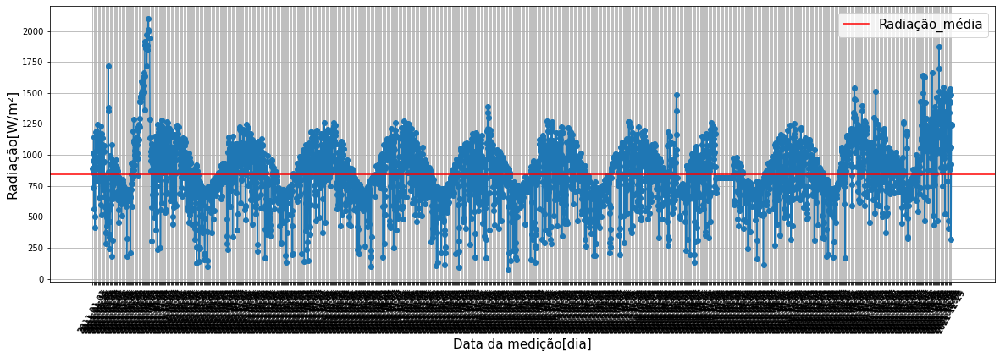

In [120]:
graf_RAD_dia(DF_A753_ANUAL)   #Ituverava

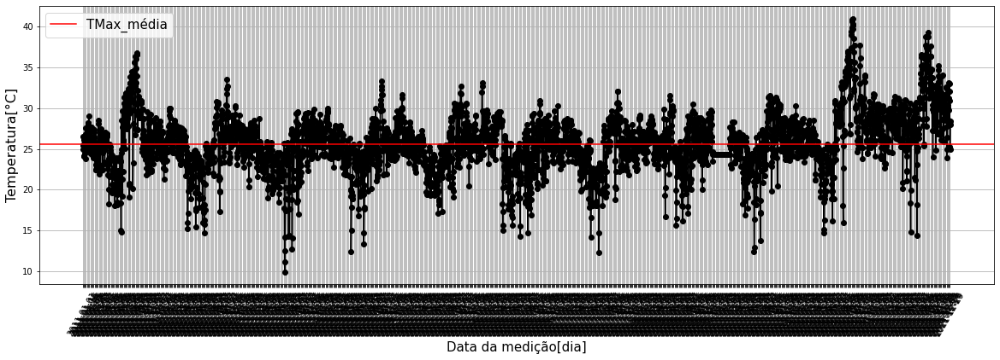

In [121]:
graf_TEMP_dia(DF_A753_ANUAL)   #Ituverava

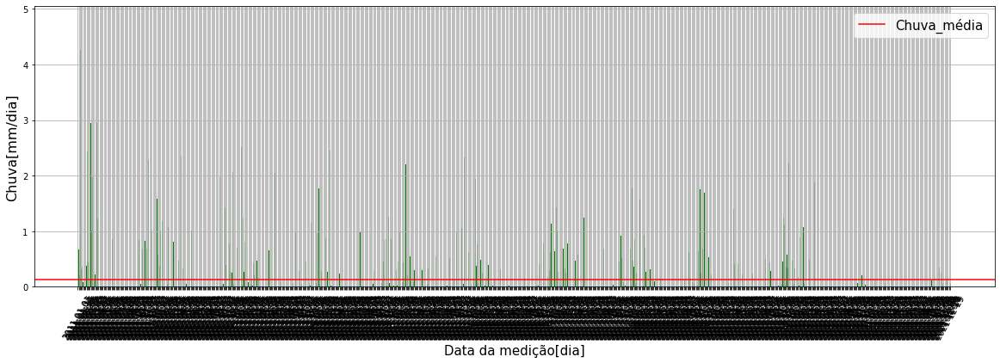

In [122]:
graf_PLUV_dia(DF_A753_ANUAL)   #Ituverava

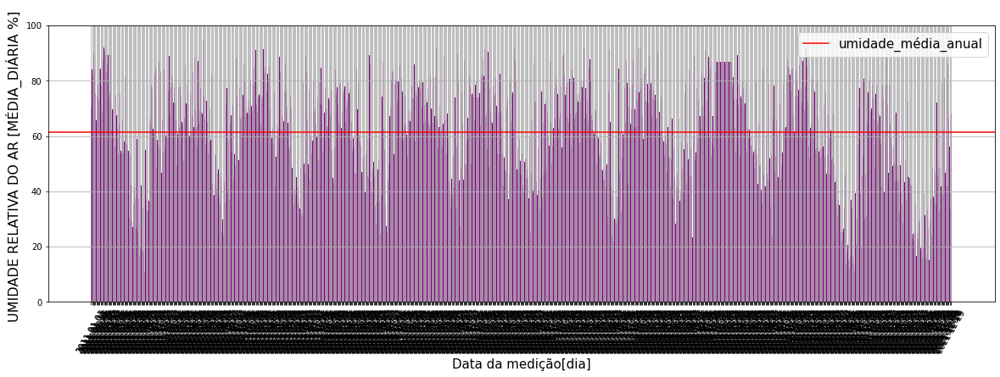

In [123]:
graf_UMID_dia(DF_A753_ANUAL)   #Ituverava

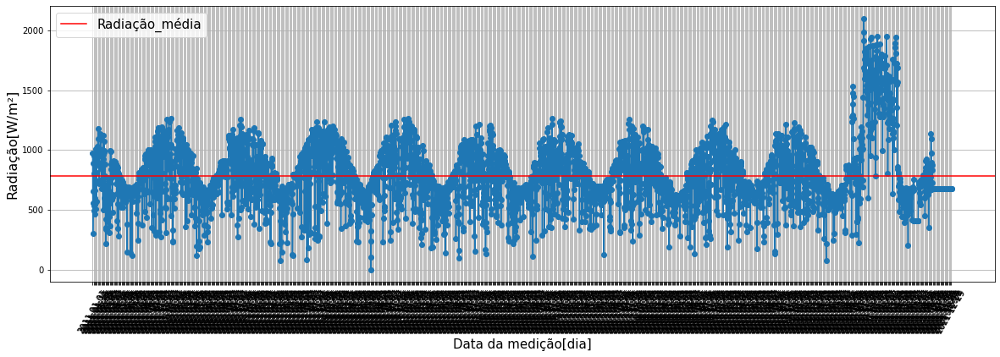

In [124]:
graf_RAD_dia(DF_A733_ANUAL)   #Jales

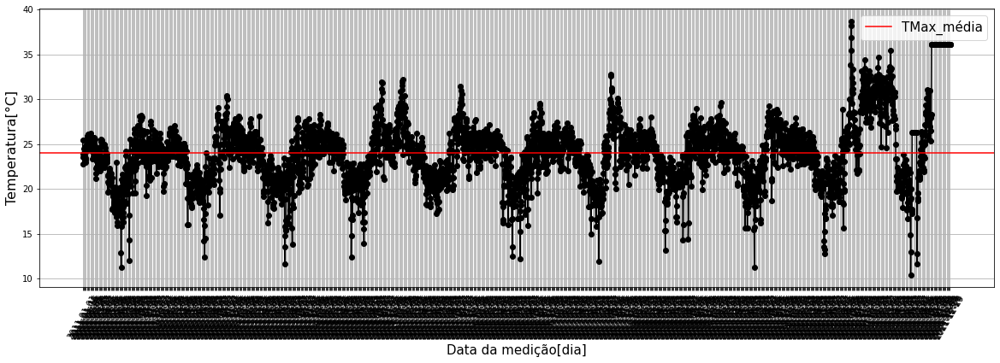

In [125]:
graf_TEMP_dia(DF_A733_ANUAL)    #Jales

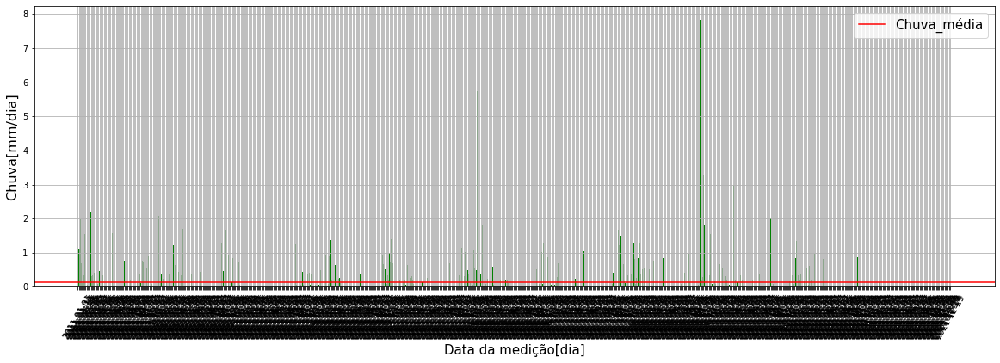

In [126]:
graf_PLUV_dia(DF_A733_ANUAL)   #Jales

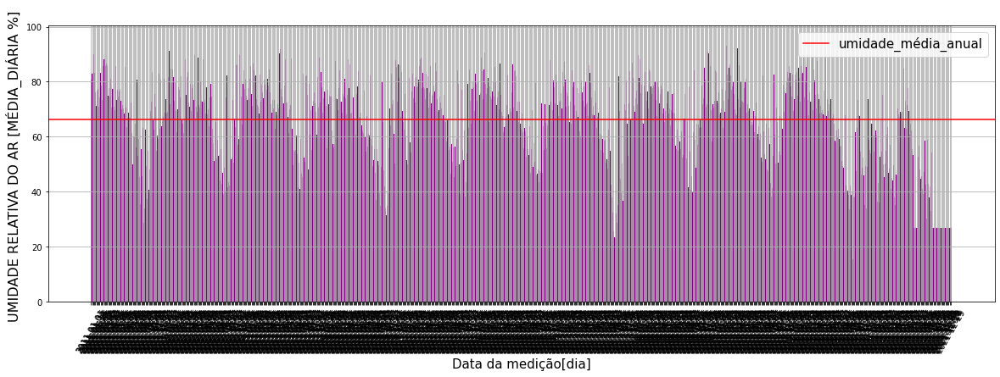

In [127]:
graf_UMID_dia(DF_A733_ANUAL)   #Jales

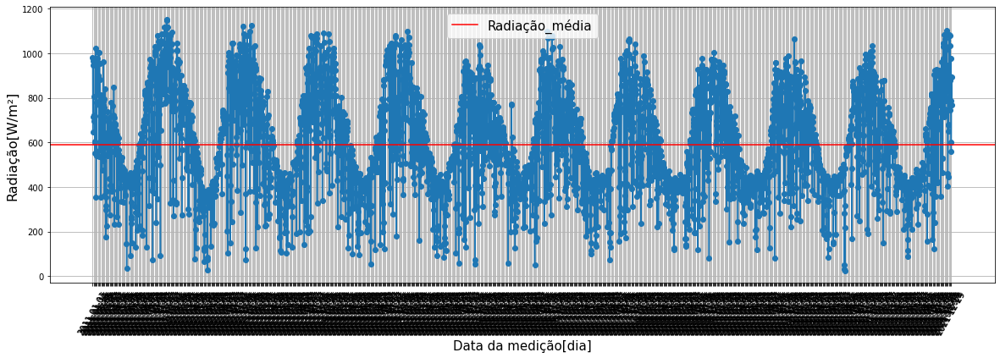

In [128]:
graf_RAD_dia(DF_A707_ANUAL)     #Presidente Prudente

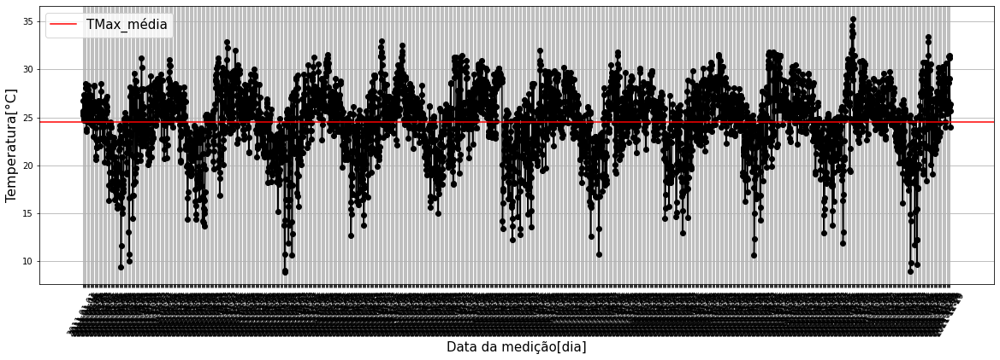

In [129]:
graf_TEMP_dia(DF_A707_ANUAL)    #Presidente Prudente

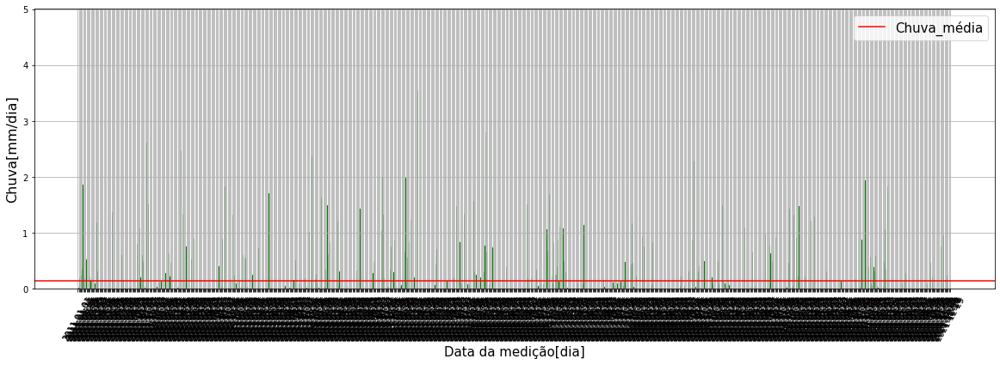

In [130]:
graf_PLUV_dia(DF_A707_ANUAL)    #Presidente Prudente

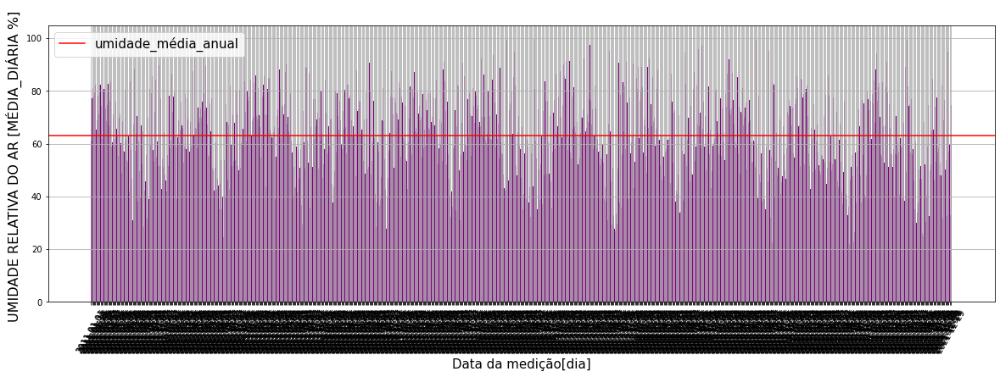

In [131]:
graf_UMID_dia(DF_A707_ANUAL)     #Presidente Prudente

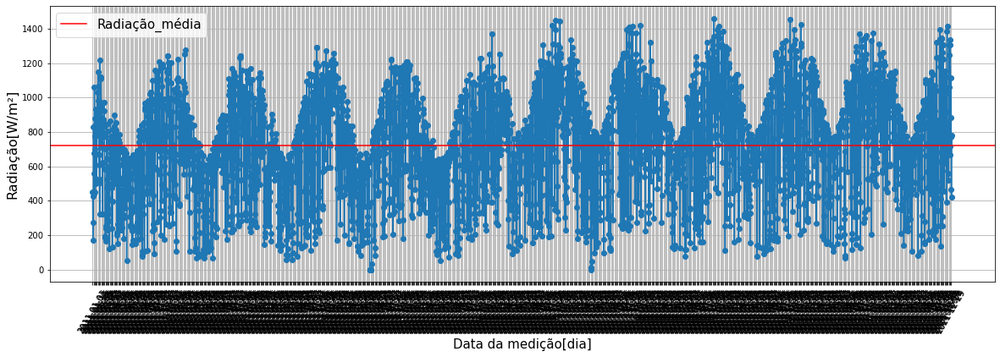

In [133]:
graf_RAD_dia(DF_A701_ANUAL)    # São Paulo

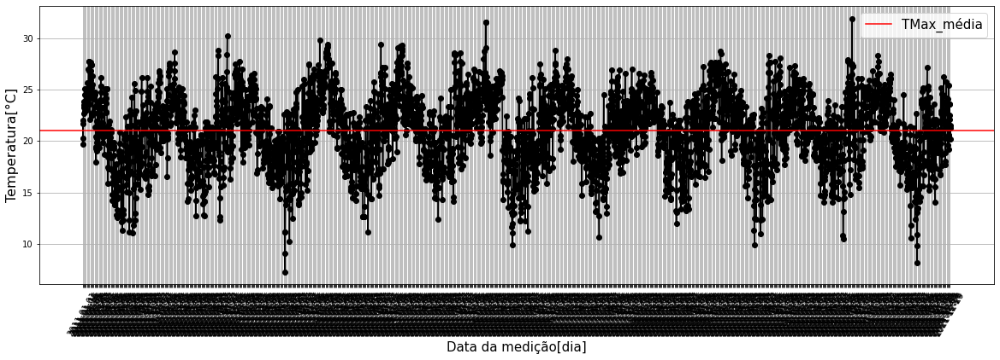

In [134]:
graf_TEMP_dia(DF_A701_ANUAL)     # São Paulo

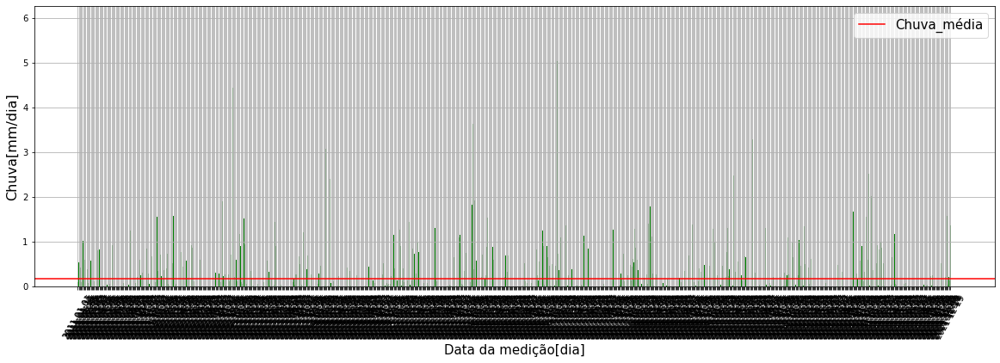

In [135]:
graf_PLUV_dia(DF_A701_ANUAL)      # São Paulo

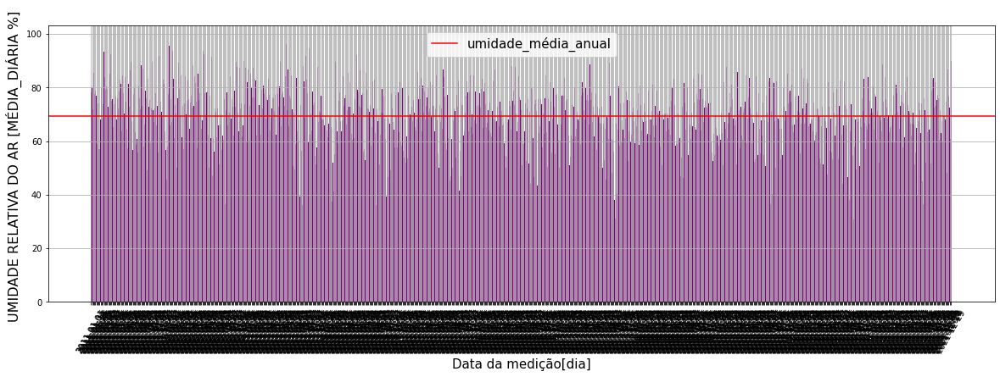

In [136]:
graf_UMID_dia(DF_A701_ANUAL)      # São Paulo

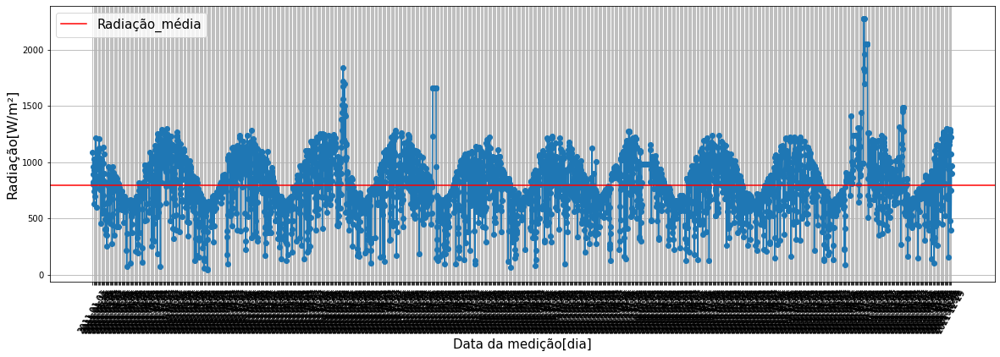

In [137]:
graf_RAD_dia(DF_A734_ANUAL)

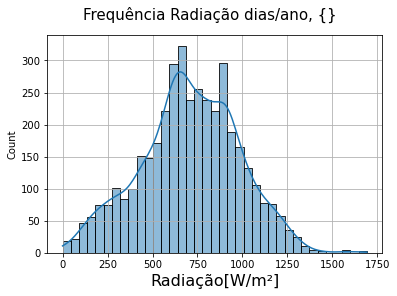

In [96]:
#histograma do ano todo por dia
import matplotlib.pyplot as plt 
df_dia = DF_A714_ANUAL.groupby(['DT_MEDICAO'],as_index=False).mean() #transforma no df do dia
#plt.figure(figsize=(10,6))
sns.histplot(data = df_dia,x='RAD', kde = True)
plt.xlabel('Radiação[W/m²]',fontsize=16)
plt.suptitle('Frequência Radiação dias/ano, {}',fontsize=15)
plt.grid(True, 'both','both')
#sns.set_style('whitegrid');

In [139]:
def hist_RAD(df):
    import matplotlib.pyplot as plt 
    df_dia = df.groupby(['DT_MEDICAO'],as_index=False).mean() #transforma no df do dia
    #plt.figure(figsize=(10,6))
    sns.histplot(data = df_dia,x='RAD', kde = True)
    plt.xlabel('Radiação[W/m²]',fontsize=16)
    plt.suptitle('Frequência Radiação dias/ano}',fontsize=15)
    plt.grid(True, 'both','both')
    #sns.set_style('whitegrid');

In [ ]:
hist_RAD(DF_A705_ANUAL) # Bauru

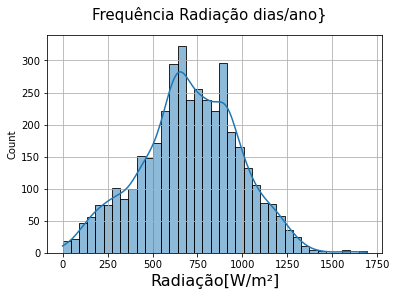

In [98]:
hist_RAD(DF_A714_ANUAL) #Itapeva

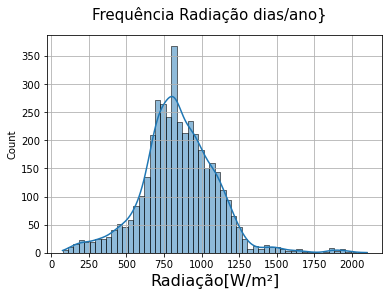

In [99]:
hist_RAD(DF_A753_ANUAL) #Ituverava

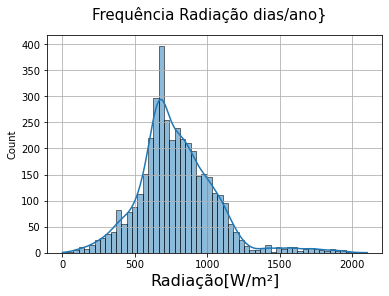

In [100]:
hist_RAD(DF_A733_ANUAL) #Jales

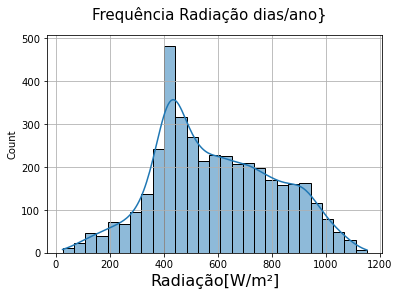

In [108]:
hist_RAD(DF_A707_ANUAL) #Presidente Prudente

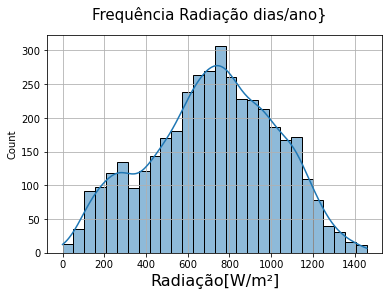

In [103]:
hist_RAD(DF_A701_ANUAL) #São Paulo 

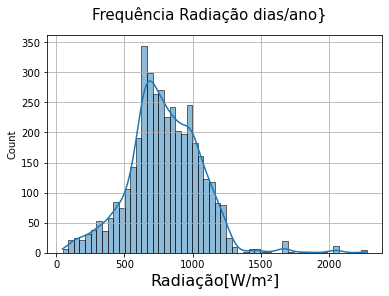

In [106]:
hist_RAD(DF_A734_ANUAL)

## Criando novas classificações:

### Estações:

- Outono: 21/03 a 21/06
- Inverno : 21/06 a 23/09
- Primavera: 23/09 a 21/12
- Verão: 21/12 a 21/03

In [ ]:
(20 Mar 2022 - 12:33h)

In [134]:
def to_season(df):
    month = df['MES']  
    day=df['DT_MEDICAO'].dt.day
    seasons = {
                  1: 'Summer',
                  2: 'Autumn',
                  3: 'Winter',
                  4: 'Spring'    
    }
        #Verão: a partir de 21 de dez até 21 de março
    if (month==12 & day>21)|(month == [1,2]) | (month==3 &  day<21):
        df['season'] = 1
        #Outono: de 21 de março até 23 de junho
    elif (month==3 &  day>=21) |(month == [4,5]) |  (month==6 & day<21):
        df['season'] = 2
        #Inverno: de 21 de junho até 23 de setembro
    elif (month==6 &  day>=21) |(month == [7,8]) |  (month==9 & day<23):
        df['season'] = 3
    else:
        df['season'] = 4

In [110]:
# import pandas as pd
# import datetime as dt

# df = pd.DataFrame({'date': pd.date_range('2000-01-01', '2001-01-01', periods=12)})
# seasons = {(1, 12, 2): 1, (3, 4, 5): 2, (6, 7, 8): 3, (9, 10, 11): 4}
# df['m'] = df.date.dt.month

# def season(ser):
#     for k in seasons.keys():
#         if ser in k:
#             return seasons[k]

# df['s'] = df.m.apply(seasons)

#def season(df):
#     df['season'] = (df['DT_MEDICAO'].dt.month%12 + 3)//3

#     seasons = {
#                  1: 'Summer',
#                  2: 'Autumn',
#                  3: 'Winter',
#                  4: 'Spring'
#     }

#     df['season_name'] = df['season'].map(seasons)
#     return df


In [50]:
DF_A734_ANUAL.drop(['season','season_name'],axis=1)

,DT_MEDICAO,CHUVA,DC_NOME,RAD_GLO,TEM_MAX,TEM_MIN,UMD_INS,HR_MEDICAO,MES
0,2020-01-01,0.0,JALES,-3.538,25.4,24.4,73.0,0,1
1,2020-01-01,0.0,JALES,-3.539,25.3,23.9,82.0,100,1
2,2020-01-01,0.0,JALES,-3.540,23.9,23.3,84.0,200,1
3,2020-01-01,0.0,JALES,-3.539,24.6,23.5,77.0,300,1
4,2020-01-01,0.0,JALES,-3.539,24.7,22.6,86.0,400,1
5,2020-01-01,0.0,JALES,-3.540,23.8,23.0,80.0,500,1
6,2020-01-01,0.0,JALES,-3.540,23.4,22.8,83.0,600,1
7,2020-01-01,0.0,JALES,-3.540,22.8,22.1,89.0,700,1
8,2020-01-01,0.0,JALES,-3.540,22.4,21.5,92.0,800,1
9,2020-01-01,0.0,JALES,14.877,21.7,21.3,94.0,900,1


In [107]:
pd.set_option('display.max_row',8808)
DF_A734_ANUAL

,DT_MEDICAO,CHUVA,DC_NOME,RAD_GLO,TEM_MAX,TEM_MIN,UMD_INS,HR_MEDICAO,MES,ANO,HR,RAD
0,2011-01-01,0.0,VALPARAISO,-3.540,25.7,25.0,65.0,0,1,2011,21.0,0.000
1,2011-01-01,0.0,VALPARAISO,-3.540,25.0,24.0,73.0,100,1,2011,22.0,0.000
2,2011-01-01,0.0,VALPARAISO,-3.540,24.3,23.6,73.0,200,1,2011,23.0,0.000
3,2011-01-01,0.0,VALPARAISO,-3.540,25.6,24.1,70.0,300,1,2011,24.0,0.000
4,2011-01-01,0.0,VALPARAISO,-3.293,25.1,23.9,76.0,400,1,2011,1.0,0.000
...,...,...,...,...,...,...,...,...,...,...,...,...
96451,2022-01-01,0.0,VALPARAISO,2686.430,32.3,29.8,56.0,1900,1,2022,16.0,2686.430
96452,2022-01-01,0.0,VALPARAISO,1936.479,30.7,29.1,54.0,2000,1,2022,17.0,1936.479
96453,2022-01-01,0.0,VALPARAISO,886.800,29.8,27.7,57.0,2100,1,2022,18.0,886.800
96454,2022-01-01,0.0,VALPARAISO,121.511,27.8,26.2,64.0,2200,1,2022,19.0,121.511


In [217]:
DF_A734_ANUAL

,DT_MEDICAO,CHUVA,DC_NOME,RAD_GLO,TEM_MAX,TEM_MIN,UMD_INS,HR_MEDICAO,MES,ANO,HR,RAD
0,2011-01-01,0.0,VALPARAISO,-3.540,25.7,25.0,65.0,0,1,2011,21.0,0.000
1,2011-01-01,0.0,VALPARAISO,-3.540,25.0,24.0,73.0,100,1,2011,22.0,0.000
2,2011-01-01,0.0,VALPARAISO,-3.540,24.3,23.6,73.0,200,1,2011,23.0,0.000
3,2011-01-01,0.0,VALPARAISO,-3.540,25.6,24.1,70.0,300,1,2011,24.0,0.000
4,2011-01-01,0.0,VALPARAISO,-3.293,25.1,23.9,76.0,400,1,2011,1.0,0.000
...,...,...,...,...,...,...,...,...,...,...,...,...
96451,2022-01-01,0.0,VALPARAISO,2686.430,32.3,29.8,56.0,1900,1,2022,16.0,2686.430
96452,2022-01-01,0.0,VALPARAISO,1936.479,30.7,29.1,54.0,2000,1,2022,17.0,1936.479
96453,2022-01-01,0.0,VALPARAISO,886.800,29.8,27.7,57.0,2100,1,2022,18.0,886.800
96454,2022-01-01,0.0,VALPARAISO,121.511,27.8,26.2,64.0,2200,1,2022,19.0,121.511


In [124]:
DF_A734_ANUAL['DT_MEDICAO'].dt.month


0        1
1        1
2        1
3        1
4        1
        ..
96451    1
96452    1
96453    1
96454    1
96455    1
Name: DT_MEDICAO, Length: 96456, dtype: int64

In [54]:
df_A734

,DC_NOME,PRE_INS,TEM_SEN,VL_LATITUDE,PRE_MAX,UF,RAD_GLO,PTO_INS,TEM_MIN,VL_LONGITUDE,...,PRE_MIN,UMD_MAX,VEN_VEL,PTO_MIN,TEM_MAX,VEN_RAJ,TEM_INS,UMD_INS,CD_ESTACAO,HR_MEDICAO
0,VALPARAISO,962.5,25.6,-21.319167,962.5,SP,-3.540,18.0,25.0,-50.930278,...,961.7,65.0,1.0,17.6,25.7,2.3,25.0,65.0,A734,0
1,VALPARAISO,963.5,25.4,-21.319167,963.5,SP,-3.540,18.9,24.0,-50.930278,...,962.5,75.0,0.6,18.2,25.0,1.9,24.1,73.0,A734,100
2,VALPARAISO,964.0,25.6,-21.319167,964.0,SP,-3.540,19.1,23.6,-50.930278,...,963.5,76.0,0.4,18.6,24.3,2.3,24.2,73.0,A734,200
3,VALPARAISO,964.0,23.1,-21.319167,964.2,SP,-3.540,19.2,24.1,-50.930278,...,964.0,74.0,3.5,19.0,25.6,6.8,25.1,70.0,A734,300
4,VALPARAISO,963.2,23.4,-21.319167,963.9,SP,-3.293,19.3,23.9,-50.930278,...,963.2,76.0,2.4,19.2,25.1,5.6,23.9,76.0,A734,400
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
96451,VALPARAISO,962.0,28.8,-21.319167,962.6,SP,2686.430,20.4,29.8,-50.930278,...,962.0,56.0,3.8,19.3,32.3,9.1,30.3,56.0,A734,1900
96452,VALPARAISO,962.0,26.7,-21.319167,962.2,SP,1936.479,19.0,29.1,-50.930278,...,962.0,57.0,4.8,18.6,30.7,8.8,29.4,54.0,A734,2000
96453,VALPARAISO,962.1,25.9,-21.319167,962.1,SP,886.800,18.5,27.7,-50.930278,...,961.8,57.0,3.3,18.3,29.8,7.4,27.7,57.0,A734,2100
96454,VALPARAISO,962.9,26.0,-21.319167,962.9,SP,121.511,18.9,26.2,-50.930278,...,962.2,64.0,2.0,18.5,27.8,5.7,26.2,64.0,A734,2200


In [105]:
m

https://www.computersciencemaster.com.br/como-criar-um-mapa-de-calor-usando-python/

In [106]:
m = folium.Map([-21, -50.], tiles='OpenStreetMap', zoom_start=6)

HeatMap(dfa).add_to(m)
#m.save(os.path.join('results', 'Heatmap2.html'))

In [118]:
dfa.rename(columns = {0:'latitute',1:'longitude'},inplace=True)

In [153]:
localizations = dfa
for i , r in dfa.iterrows():
    print(r['latitute'],r['longitude'])
    
    

-22.358052 -49.028877
-23.98194443 -48.88583333
-20.35972222 -47.77527777
-20.165 -50.59499999
-22.119867 -51.408637
-23.496294 -46.620088
-21.31916666 -50.93027777


In [181]:
m = folium.Map([-22, -50.], tiles='cartodb positron', zoom_start=7)

tooltip='Clique'

folium.Marker([-22.358052,-49.028877], popup="<b>BAURU - A705</b>", tooltip=tooltip, icon=folium.Icon(icon="cloud")).add_to(m)
folium.Marker([-23.98194443,-48.88583333], popup="<b>ITAPEVA - A714</b>", tooltip=tooltip, icon=folium.Icon(icon="cloud")).add_to(m)
folium.Marker([-20.35972222,-47.77527777], popup="<b>ITUVERAVA - A753</b>", tooltip=tooltip, icon=folium.Icon(icon="cloud")).add_to(m)
folium.Marker([-20.165,-50.59499999], popup="<b>JALES - A733</b>", tooltip=tooltip, icon=folium.Icon(icon="cloud")).add_to(m)
folium.Marker([-22.119867,-51.408637], popup="<b>PRESIDENTE PRUDENTE - A707</b>", tooltip=tooltip, icon=folium.Icon(icon="cloud")).add_to(m)
folium.Marker([-23.496294,-46.620088], popup="<b>SÃO PAULO - A701</b>", tooltip=tooltip, icon=folium.Icon(icon="cloud")).add_to(m)
folium.Marker([-21.31916666,-50.93027777], popup="<b>VALPARAÍSO - A771</b>", tooltip=tooltip, icon=folium.Icon(icon="cloud")).add_to(m)
#HeatMap(dfa).add_to(m)
#m.save(os.path.join('results', 'Heatmap3.html'))

In [182]:
m

In [215]:
m1 = folium.Map([-22, -50.], tiles='cartodb positron', zoom_start=7)

tooltip='Clique!'

folium.CircleMarker([-22.358052,-49.028877], radius=40,
    popup= "<b>BAURU</b>",
    color="#3186cc",
    fill=True,
    fill_color="#3186cc",
                   tooltip='A705').add_to(m1)
folium.CircleMarker([-23.98194443,-48.88583333], radius=35,
    popup= "<b>ITAPEVA</b>",
    color="#3186cc",
    fill=True,
    fill_color="#3186cc",
                   tooltip='A714').add_to(m1)
folium.CircleMarker([-20.35972222,-47.77527777], radius=30,
    popup= "<b>ITUVERAVA</b>",
    color="#3186cc",
    fill=True,
    fill_color="#3186cc",
                   tooltip='A753').add_to(m1)
folium.CircleMarker([-20.165,-50.59499999],radius=30,
    popup= "<b>JALES</b>",
    color="#3186cc",
    fill=True,
    fill_color="#3186cc",
                   tooltip='A733').add_to(m1)
folium.CircleMarker([-22.119867,-51.408637],  radius=30,
    popup="<b>PRESIDENTE PRUDENTE</b>",
    color="#3186cc",
    fill=True,
    fill_color="#3186cc",
                   tooltip='A707').add_to(m1)
folium.CircleMarker([-23.496294,-46.620088], radius=60,
    popup="<b>SÃO PAULO</b>", 
    color="#3186cc",
    fill=True,
    fill_color="#3186cc",
                   tooltip='A701').add_to(m1)
folium.Circle([-21.31916666,-50.93027777],radius=100, 
    popup="<b>VALPARAÍSO - A771</b>", 
    color="crimson",
    fill=False,
    fill_color="#3186cc",
                   tooltip=tooltip).add_to(m1)
#HeatMap(dfa).add_to(m1)

In [216]:
m1

In [225]:
numero_estado = 35
data = DF_A734_ANUAL

bins = list(data["RAD"].quantile([0, 0.25, 0.5, 0.75, 1]))
state_geo = f"https://raw.githubusercontent.com/tbrugz/geodata-br/master/geojson/geojs-{numero_estado}-mun.json"


m2 = folium.Map(location=[-22, -50.], zoom_start=7)

folium.Choropleth(
    geo_data=state_geo,
    data=data,
    columns=["cidade", "RAD"],
    #key_on="feature.id",
    fill_color="BuPu",
    fill_opacity=0.7,
    line_opacity=0.5,
    legend_name="Unemployment Rate (%)",
    bins=bins,
    reset=True,
).add_to(m)

folium.LayerControl().add_to(m2)
m2

In [224]:
DF_A734_ANUAL

,DT_MEDICAO,CHUVA,DC_NOME,RAD_GLO,TEM_MAX,TEM_MIN,UMD_INS,HR_MEDICAO,MES,ANO,HR,RAD,cidade
0,2011-01-01,0.0,VALPARAISO,-3.540,25.7,25.0,65.0,0,1,2011,21.0,0.000,Valparaíso
1,2011-01-01,0.0,VALPARAISO,-3.540,25.0,24.0,73.0,100,1,2011,22.0,0.000,Valparaíso
2,2011-01-01,0.0,VALPARAISO,-3.540,24.3,23.6,73.0,200,1,2011,23.0,0.000,Valparaíso
3,2011-01-01,0.0,VALPARAISO,-3.540,25.6,24.1,70.0,300,1,2011,24.0,0.000,Valparaíso
4,2011-01-01,0.0,VALPARAISO,-3.293,25.1,23.9,76.0,400,1,2011,1.0,0.000,Valparaíso
...,...,...,...,...,...,...,...,...,...,...,...,...,...
96451,2022-01-01,0.0,VALPARAISO,2686.430,32.3,29.8,56.0,1900,1,2022,16.0,2686.430,Valparaíso
96452,2022-01-01,0.0,VALPARAISO,1936.479,30.7,29.1,54.0,2000,1,2022,17.0,1936.479,Valparaíso
96453,2022-01-01,0.0,VALPARAISO,886.800,29.8,27.7,57.0,2100,1,2022,18.0,886.800,Valparaíso
96454,2022-01-01,0.0,VALPARAISO,121.511,27.8,26.2,64.0,2200,1,2022,19.0,121.511,Valparaíso
